# INF2008 Group P5-1 
# Singapore HDB Resale Price Prediction

# 1. Problem Statement

HDB flats are often labelled as the government's first gift to Singaporeans, leading majority of the population living in them. While many Singaporeans acquire their homes through the Build-to-Order (BTO) scheme, a considerable number of people choose to purchase flats on the resale market due to various reasons.

Throughout the years, it has become a known fact that purchasing a home is often the largest financial decision most people will make, it is essential to ensure that the price paid reflects the property's true value. Overpaying for a flat could lead to significant financial setbacks, sometimes amounting to tens or even hundreds of thousands of dollars.

Determining the right price for a HDB resale flat is complicated, as there are many factors that influence housing prices, giving buyers a hard time in determining the best home for their future. This project aims to tackle the challenge of accurately estimating resale values.

Key Question:
**<center>How can we effectively forecast the resale price of an HDB flat using relevant data?</center>**

This initiative seeks to empower buyers by providing clarity on the factors that drive resale prices, helping them make sound financial decisions when selecting resale flats. To achieve this, a linear regression model will be utilized, with resale price as the outcome variable and key housing-related factors as predictors.

Model performance will be evaluated using the Root Mean Square Error (RMSE), where a smaller RMSE reflects better predictive accuracy.

The project’s primary beneficiaries are home buyers seeking guidance on fair pricing. Additionally, housing agents, who play a critical role in advising buyers, will also find the insights valuable.

# 2. Data Collection

### 2.1 Data Import

Let us start off by importing the combined dataset.

In [26]:
%pip install pandas matplotlib numpy plotly nbformat seaborn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Importing data.
df = pd.read_csv('../dataset/combined_data.csv')

In [3]:
print(df.shape)
df.head(10)

(235565, 11)


,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,07 TO 09,60.0,Improved,1986,70,255000.0
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1981,65,275000.0
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,01 TO 03,69.0,New Generation,1980,64,285000.0
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1979,63,290000.0
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,07 TO 09,68.0,New Generation,1980,64,290000.0
5,2015-01,ANG MO KIO,3 ROOM,603,ANG MO KIO AVE 5,07 TO 09,67.0,New Generation,1980,64,290000.0
6,2015-01,ANG MO KIO,3 ROOM,709,ANG MO KIO AVE 8,01 TO 03,68.0,New Generation,1980,64,290000.0
7,2015-01,ANG MO KIO,3 ROOM,333,ANG MO KIO AVE 1,01 TO 03,68.0,New Generation,1981,65,293000.0
8,2015-01,ANG MO KIO,3 ROOM,109,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,62,300000.0
9,2015-01,ANG MO KIO,3 ROOM,564,ANG MO KIO AVE 3,13 TO 15,68.0,New Generation,1985,69,307500.0


As shown above, we have a total of up to 235,565 datasets with 11 columns, now we will walk through the data cleaning process.

# 3 Data Preprocessing 

### 3.1 Handling Duplicate Values

In [4]:
df.duplicated().sum()
df[df.duplicated()]

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
661,2015-01,KALLANG/WHAMPOA,3 ROOM,57,GEYLANG BAHRU,16 TO 18,65.0,Improved,1974,58,315000.0
2166,2015-02,TAMPINES,3 ROOM,403,TAMPINES ST 41,07 TO 09,69.0,Improved,1985,69,350000.0
3896,2015-04,BEDOK,4 ROOM,701,BEDOK RESERVOIR RD,10 TO 12,93.0,New Generation,1980,64,400000.0
4246,2015-04,CLEMENTI,3 ROOM,714,CLEMENTI WEST ST 2,10 TO 12,67.0,New Generation,1980,64,300000.0
5493,2015-05,BEDOK,3 ROOM,409,BEDOK NTH AVE 2,07 TO 09,68.0,New Generation,1980,63,340000.0
...,...,...,...,...,...,...,...,...,...,...,...
225347,2024-10,SENGKANG,4 ROOM,329B,ANCHORVALE ST,10 TO 12,93.0,Model A,2015,89 years 11 months,695000.0
226620,2024-05,SENGKANG,5 ROOM,430D,FERNVALE LINK,19 TO 21,112.0,Improved,2015,90 years 01 month,770000.0
228223,2024-12,TAMPINES,4 ROOM,612A,TAMPINES NTH DR 1,10 TO 12,93.0,Model A,2020,94 years 11 months,780000.0
233098,2024-01,YISHUN,4 ROOM,462C,YISHUN AVE 6,01 TO 03,93.0,Model A,2019,94 years 08 months,530000.0


As reflected, we have identified 321 rows x 11 columns of duplicated data, now let us drop the duplicated data.

In [5]:
df = df.drop_duplicates()

# Looking for columns with null values
df.isnull().sum()

month                  0
town                   0
flat_type              0
block                  0
street_name            0
storey_range           0
floor_area_sqm         0
flat_model             0
lease_commence_date    0
remaining_lease        0
resale_price           0
dtype: int64

As shown above, we have detected no null values within the dataset.

### 3.2 Transforming remaining_lease

Due to the combination of datasets, we have identified that the remaining_lease columns are not consistent in terms of the units defined. Therefore, we decided to normalise them in years format.

In [6]:
# Calculate remaining lease using lease commence date
current_year = 2025  # Replace with the relevant current year
df['remaining_lease'] = 99 - (current_year - df['lease_commence_date'])

# Ensure no negative values (clip to 0 for expired leases)
df['remaining_lease'] = df['remaining_lease'].clip(lower=0)

In [7]:
df.tail(10) #The last 10 rows

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
235555,2025-01,YISHUN,5 ROOM,238,YISHUN RING RD,01 TO 03,127.0,Improved,1985,59,650000.0
235556,2025-01,YISHUN,5 ROOM,109,YISHUN RING RD,07 TO 09,121.0,Improved,1982,56,695000.0
235557,2025-01,YISHUN,5 ROOM,297,YISHUN ST 20,01 TO 03,111.0,Improved,2000,74,608000.0
235558,2025-01,YISHUN,5 ROOM,265,YISHUN ST 22,01 TO 03,122.0,Improved,1986,60,625000.0
235559,2025-01,YISHUN,5 ROOM,511B,YISHUN ST 51,10 TO 12,113.0,Improved,2017,91,730000.0
235560,2025-01,YISHUN,5 ROOM,502B,YISHUN ST 51,07 TO 09,112.0,Improved,2018,92,776000.0
235561,2025-01,YISHUN,5 ROOM,871,YISHUN ST 81,07 TO 09,122.0,Improved,1988,62,738000.0
235562,2025-01,YISHUN,5 ROOM,851,YISHUN ST 81,10 TO 12,127.0,Improved,1988,62,740000.0
235563,2025-01,YISHUN,EXECUTIVE,352,YISHUN RING RD,04 TO 06,146.0,Maisonette,1988,62,1008000.0
235564,2025-01,YISHUN,EXECUTIVE,614,YISHUN ST 61,04 TO 06,146.0,Maisonette,1987,61,800000.0


Using this example, this is to illustrate the changes made for remaining_lease on the second half of the dataset from years and months into years only.

### 3.3 Handling Data Types

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 235244 entries, 0 to 235564
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                235244 non-null  object 
 1   town                 235244 non-null  object 
 2   flat_type            235244 non-null  object 
 3   block                235244 non-null  object 
 4   street_name          235244 non-null  object 
 5   storey_range         235244 non-null  object 
 6   floor_area_sqm       235244 non-null  float64
 7   flat_model           235244 non-null  object 
 8   lease_commence_date  235244 non-null  int64  
 9   remaining_lease      235244 non-null  int64  
 10  resale_price         235244 non-null  float64
dtypes: float64(2), int64(2), object(7)
memory usage: 21.5+ MB


### 3.4 Transforming storey_range



As storey_range are values that are categorical e.g. 4 TO 6, we need to transform them to a median value such that it allows us to have more accurate insights when identifying trends or relationships as the different storey levels affects HDB prices. By transforming them to numerical data allows us to have an easier time when creating our models.

In [9]:
# Transform storey_range values to median values

def convert_to_median(row):
	storey_range = row["storey_range"].split(" TO ")
	median = (int(storey_range[0]) + int(storey_range[1])) / 2
	return median

df["median_storey"] = df.apply(convert_to_median, axis=1)
df = df.drop(columns=['storey_range'])

In [10]:
df.tail()

,month,town,flat_type,block,street_name,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,median_storey
235560,2025-01,YISHUN,5 ROOM,502B,YISHUN ST 51,112.0,Improved,2018,92,776000.0,8.0
235561,2025-01,YISHUN,5 ROOM,871,YISHUN ST 81,122.0,Improved,1988,62,738000.0,8.0
235562,2025-01,YISHUN,5 ROOM,851,YISHUN ST 81,127.0,Improved,1988,62,740000.0,11.0
235563,2025-01,YISHUN,EXECUTIVE,352,YISHUN RING RD,146.0,Maisonette,1988,62,1008000.0,5.0
235564,2025-01,YISHUN,EXECUTIVE,614,YISHUN ST 61,146.0,Maisonette,1987,61,800000.0,5.0


In [11]:
analysisDF = df # For analysis
analysisDF.head()

,month,town,flat_type,block,street_name,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,median_storey
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,60.0,Improved,1986,60,255000.0,8.0
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,68.0,New Generation,1981,55,275000.0,2.0
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,69.0,New Generation,1980,54,285000.0,2.0
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,68.0,New Generation,1979,53,290000.0,2.0
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,68.0,New Generation,1980,54,290000.0,8.0


# 4 Data Analysis

### 4.1 Distribution of Dependent Variables

In [12]:
analysisDF['resale_price'].describe()

count    2.352440e+05
mean     4.977054e+05
std      1.741972e+05
min      1.400000e+05
25%      3.700000e+05
50%      4.638880e+05
75%      5.950000e+05
max      1.600000e+06
Name: resale_price, dtype: float64

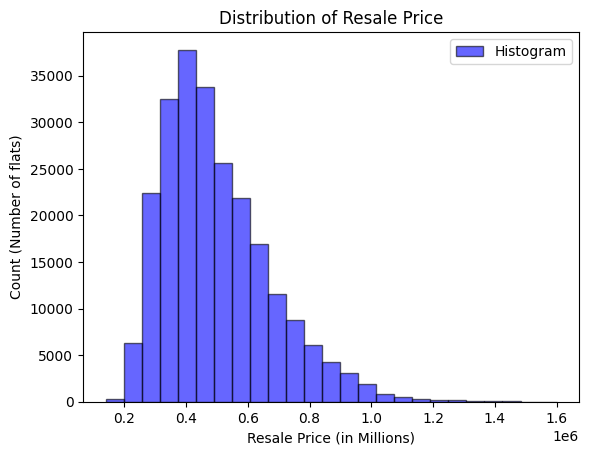

In [13]:
data = analysisDF['resale_price']
plt.hist(data, bins=25, alpha=0.6, color='b', edgecolor='black', label='Histogram')

plt.title('Distribution of Resale Price')
plt.xlabel('Resale Price (in Millions)')
plt.ylabel('Count (Number of flats)')

plt.legend()

plt.show()

Interpretation: The resale price distribution is slightly left-skewed, with the majority of flats priced in the lower range. However, the tail extends toward higher prices, indicating the presence of some higher-value properties, which aligns with the trends observed in the summary statistics.

Let us get a better understanding of our resale price by breaking it across features.

C:\Users\OJKJ\AppData\Local\Temp\ipykernel_6368\2139689074.py:8: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


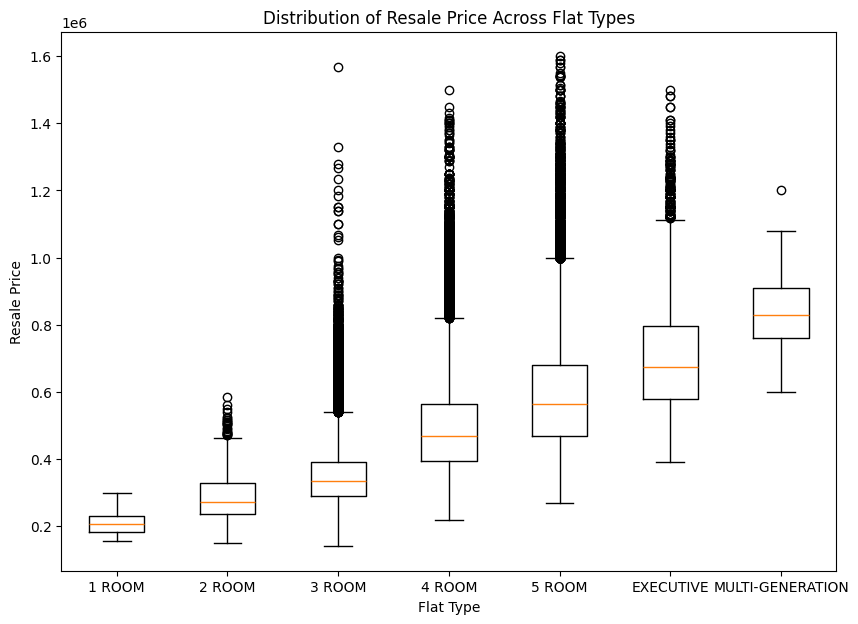

In [14]:
flat_type_order = ['1 ROOM', '2 ROOM', '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', 'MULTI-GENERATION']

# Reorder the data to follow the specified flat type order
analysisDF['flat_type'] = pd.Categorical(analysisDF['flat_type'], categories=flat_type_order, ordered=True)
analysisDF = analysisDF.sort_values('flat_type')

plt.figure(figsize=(10, 7))
plt.boxplot(
    [analysisDF.loc[df['flat_type'] == flat_type, 'resale_price'] for flat_type in flat_type_order],
    labels=flat_type_order
)

plt.title('Distribution of Resale Price Across Flat Types')
plt.xlabel('Flat Type')
plt.ylabel('Resale Price')

plt.show()

Larger flat types generally have higher resale prices, with 1 ROOM and 2 ROOM flats being the cheapest and EXECUTIVE and MULTI-GENERATION flats being the most expensive. Smaller flats have more consistent prices, while larger ones show more variation and include higher-priced outliers. Some 5 ROOM and EXECUTIVE flats are priced over $1.5 million, likely due to premium locations or features.

C:\Users\OJKJ\AppData\Local\Temp\ipykernel_6368\234786280.py:10: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, vert=False, labels=towns)


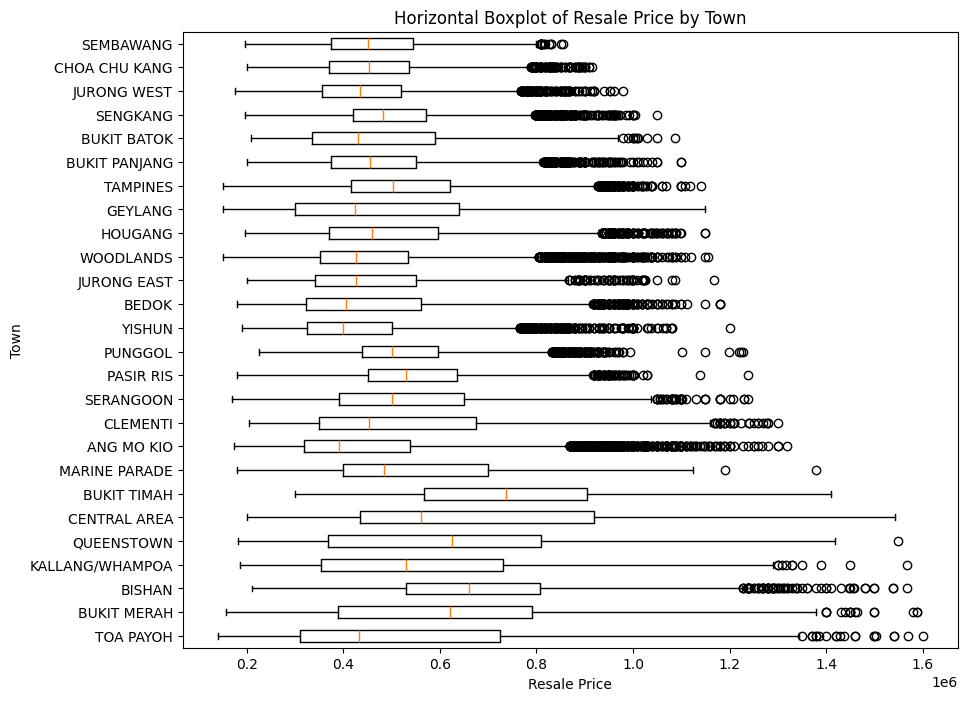

In [15]:
# Sort the DataFrame by resale_price
sorted_df = analysisDF.sort_values(by='resale_price', ascending=False)

# Get unique towns
towns = sorted_df['town'].unique()

data = [sorted_df.loc[sorted_df['town'] == town, 'resale_price'] for town in towns]

plt.figure(figsize=(10, 8))
plt.boxplot(data, vert=False, labels=towns)

plt.xlabel('Resale Price') 
plt.ylabel('Town') 
plt.title('Horizontal Boxplot of Resale Price by Town') 

plt.show()

Interpretation: Resale prices vary a lot depending on the location and nearby facilities. Central towns like Bukit Timah, Queenstown, and Central Area are more expensive because they’re closer to the city, well-connected, and have more amenities. Suburban towns like Sembawang and Choa Chu Kang are cheaper since they’re farther from the city and less developed. Prices can also go up in towns near MRT stations, good schools, or malls. The high-priced outliers in some towns might be due to unique features or very desirable locations.

## 4.2 Scatterplots of Strongest Independent Varables against Dependent Variables

### 4.2.1 Relationship between Floor Area and Resale Price

In [16]:
import plotly.express as px
import nbformat


scatterplt = px.scatter(
    analysisDF,
    x='floor_area_sqm',
    y='resale_price',
    color='flat_type',  # Optional: Add this for color differentiation
    title='Relationship Between Floor Area and Resale Price',
    width=900,
    height=800
)

scatterplt.show()



Interpretation: The scatterplot reveals a clear positive relationship between floor area and resale price, indicating that larger flats tend to have higher resale prices. Smaller flats, such as 1 ROOM and 2 ROOM, are concentrated in the lower left of the plot, with smaller floor areas and lower resale prices. In contrast, larger flats like EXECUTIVE and MULTI-GENERATION are positioned in the upper right, reflecting their bigger floor areas and significantly higher prices. Each flat type forms distinct clusters, suggesting that floor area strongly correlates with both the flat type and its price. However, there are some outliers, where certain flats have much higher prices than expected for their size, likely due to other factors such as location, condition, or special features. Overall, the plot highlights that while larger floor areas generally lead to higher prices, other variables also play a role in determining resale value.

### 4.2.2 Relationship between Lease Commence Date and Resale Price

In [17]:
# Group by 'lease_commence_date' and calculate the average resale price
avg_price_by_lease = analysisDF.groupby('lease_commence_date')['resale_price'].mean().reset_index()

fig = px.line(
    avg_price_by_lease,
    x='lease_commence_date',
    y='resale_price',
    title='Average Resale Price by Lease Commencement Year',
    labels={
        'lease_commence_date': 'Lease Commencement Year',
        'resale_price': 'Average Resale Price'
    },
    width=900,
    height=600,
    markers=True 
)


fig.update_layout(
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    xaxis_tickangle=45, 
    template='plotly_white',
)

fig.show()

Interpretation: Flats with newer leases (1990s to 2010s) generally have higher resale prices because they’re in better condition and come with modern features. Older flats (before the 1990s) are usually cheaper because they have shorter leases left, making them less attractive to buyers. However, flats in prime locations or near amenities like MRT stations, schools, or malls can still be expensive, even if they’re older. Prices also change based on market demand and trends.

### 4.2.3 Relationship between Remaining Lease and Resale Price

In [18]:
fig = px.scatter(
    analysisDF,
    x='remaining_lease',
    y='resale_price',
    title='Resale Price vs. Remaining Lease',
    labels={'remaining_lease': 'Remaining Lease (Years)', 'resale_price': 'Resale Price'},
    width=900,
    height=600,
    opacity=0.6
)

fig.show()

Interpreation: Flats with longer remaining leases, especially those with over 80 years left, tend to have higher resale prices because they are more desirable and easier to finance. Flats with shorter remaining leases, particularly below 50 years, are generally cheaper since they are less attractive to buyers and have loan restrictions. However, some flats with short leases still sell at high prices, likely due to their prime location or proximity to key amenities like MRT stations or malls.

### 4.2.4 Final Dataset

This will be the dataset that we will be using for data analysis and most importantly, for our machine learning models.

In [19]:
# Drop lease_commence_date, street_name, block and month

df.drop(columns=['lease_commence_date', 'street_name', 'block', 'month'], inplace=True)
finalDf = df # For models
column_names = finalDf.columns
print(column_names)

Index(['town', 'flat_type', 'floor_area_sqm', 'flat_model', 'remaining_lease',
       'resale_price', 'median_storey'],
      dtype='object')


### 4.2.5 Correlation Matrix

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 235244 entries, 0 to 235564
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype   
---  ------           --------------   -----   
 0   town             235244 non-null  object  
 1   flat_type        235244 non-null  category
 2   floor_area_sqm   235244 non-null  float64 
 3   flat_model       235244 non-null  object  
 4   remaining_lease  235244 non-null  int64   
 5   resale_price     235244 non-null  float64 
 6   median_storey    235244 non-null  float64 
dtypes: category(1), float64(3), int64(1), object(2)
memory usage: 20.9+ MB


resale_price       1.000000
floor_area_sqm     0.587854
remaining_lease    0.380735
median_storey      0.351164
Name: resale_price, dtype: float64


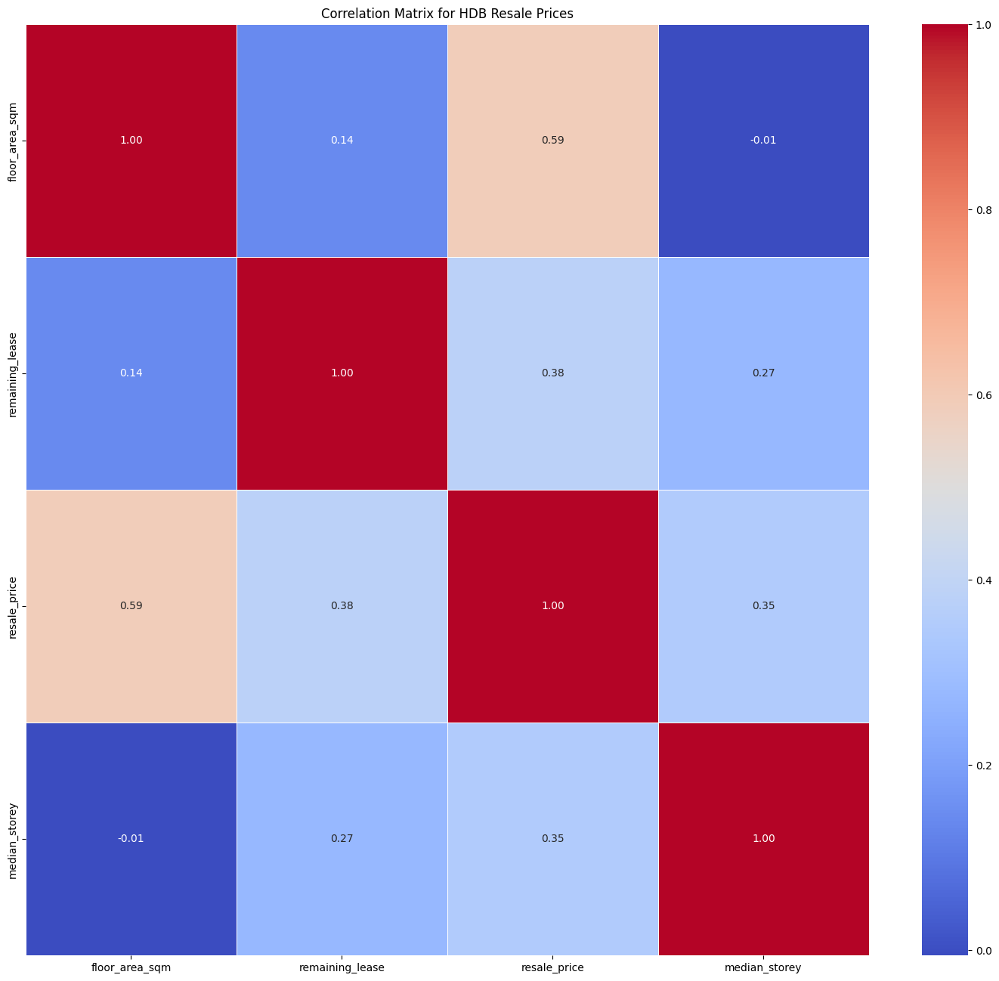

In [21]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


non_numeric_cols = ['town', 'flat_type', 'flat_model']
df_numeric = finalDf.drop(columns=non_numeric_cols, errors='ignore')

# Display correlation values of each feature with resale_price
corr_matrix = df_numeric.corr()
print(corr_matrix["resale_price"].sort_values(ascending=False))


plt.figure(figsize=(18, 16))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix for HDB Resale Prices")
plt.show()

Intepretation: This chart shows how different factors are related:

Flat size (floor area) have the strongest impact on resale price, as bigger flats tend to be more expensive. 
The remaining lease also plays a role in affecting resale prices i.e. newer flats, longer remaining lease are more expensive, but other factors such as location of the flat also matter.
The median storey of a unit affects resale prices as the higher you stay, the pricer the unit is.

# 5 Predictive Modelling

So our objective here is to build machine learning models to predict resale prices based on features that highly correlate to resale prices: floor area, remaining lease and median storey.

The code below prepares the dataset for machine learning by separating features (independent variables) and the target variable (dependent variable). It also ensures that categorical and numerical features are correctly classified for preprocessing. We also create a preprocessing pipeline for categorical and numerical features, applies transformations, and verifies that the transformed data is correctly formatted.

In [22]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer

features = finalDf.drop(columns=['resale_price'])
target = finalDf['resale_price']

categorical_features = ['town', 'flat_type', 'flat_model']
numerical_features = [col for col in features.columns if col not in categorical_features]

#Preprocessing Pipeline
preprocessor = ColumnTransformer([
    ('num', MinMaxScaler(), numerical_features),
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_features)
])

#Split train-test sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

**Random Forest Regressor**

In [23]:
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Random Forest Cross-Validation R² Scores: [0.81719584 0.81895362 0.81960286 0.8197799  0.81895041]
Random Forest Mean Cross-Validation R² Score: 0.82
Random Forest Regressor R² Score: 0.82
Random Forest Regressor RMSE: 74102.28


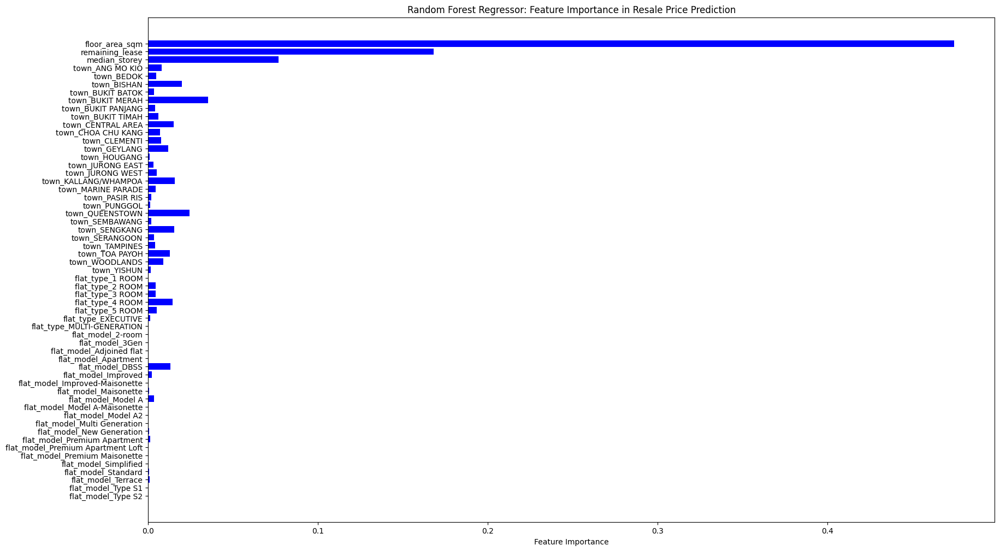

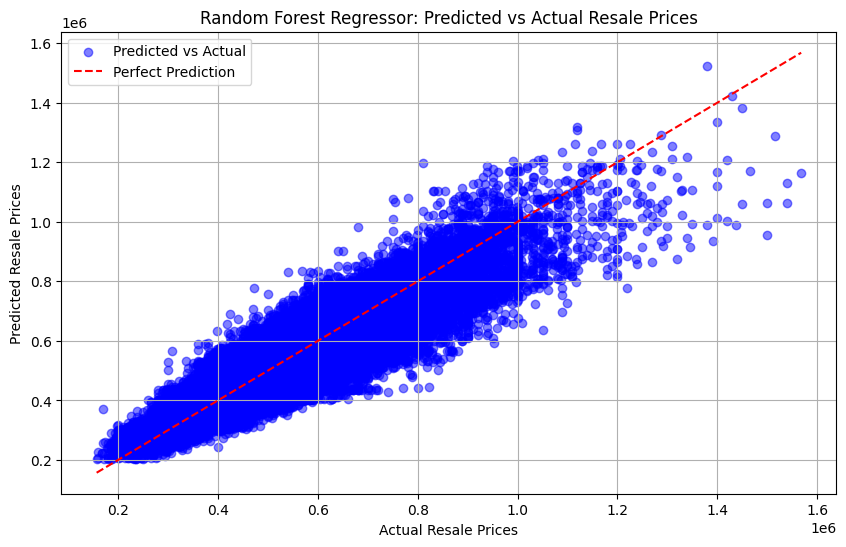

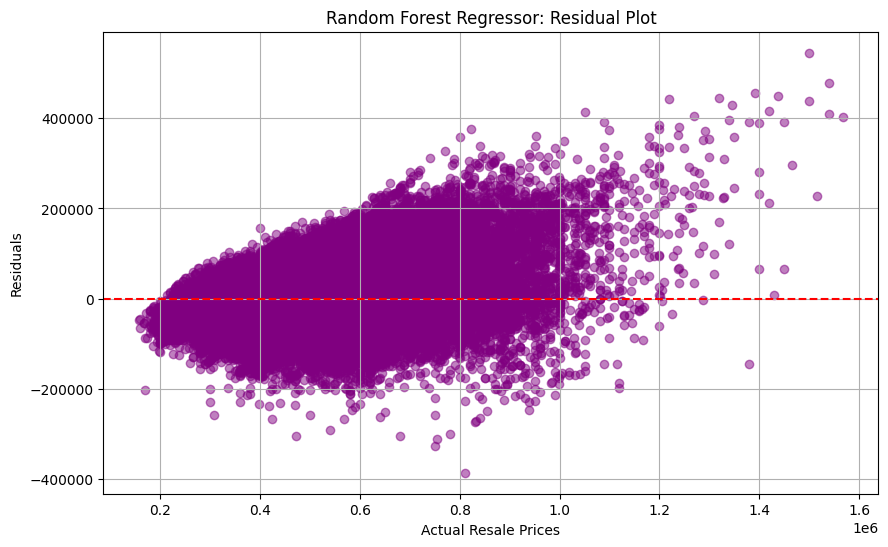

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import cross_val_score

rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=200, max_depth=20, n_jobs=-1, random_state=42))
])

rf_pipeline.fit(X_train, y_train)

# Perform 5-Fold Cross-Validation on the Training Set
rf_cv_scores = cross_val_score(rf_pipeline, X_train, y_train, cv=5, scoring='r2', n_jobs=-1)

print(f"Random Forest Cross-Validation R² Scores: {rf_cv_scores}")
print(f"Random Forest Mean Cross-Validation R² Score: {rf_cv_scores.mean():.2f}")

y_pred = rf_pipeline.predict(X_test)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"Random Forest Regressor R² Score: {r2:.2f}")
print(f"Random Forest Regressor RMSE: {rmse:.2f}")

# Feature Importance Analysis
feature_names_rf = (
    numerical_features +
    list(rf_pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))
)
feature_importance_rf = rf_pipeline.named_steps['regressor'].feature_importances_

plt.figure(figsize=(20, 12))
plt.barh(feature_names_rf, feature_importance_rf, color='blue')
plt.xlabel("Feature Importance")
plt.title("Random Forest Regressor: Feature Importance in Resale Price Prediction")
plt.gca().invert_yaxis()
plt.show()

# Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("Random Forest Regressor: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Residual Plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Random Forest Regressor: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

Insights from the Visualizations

1. Feature Importance

    The first chart highlights the most influential factors in predicting HDB resale prices. Floor area (sqm) dominates as the most critical feature, significantly outweighing all others. This aligns with the common expectation that larger flats command higher resale prices. The second most important factor is remaining lease, indicating that flats with a longer lease period are generally more valuable. Median storey level also plays a notable role, likely because higher-floor units often fetch higher prices due to better views and lower noise pollution.

    While town and flat type categories contribute, their influence is relatively minor compared to these three key factors. This suggests that while location and flat design matter, buyers prioritize size and lease duration over other factors when determining resale value.

2. Predicted vs. Actual Plot

    The second chart evaluates the accuracy of the Random Forest model in predicting resale prices. Each blue dot represents a transaction, while the red dashed line indicates a perfect prediction (where the predicted price equals the actual price).

    The majority of predictions cluster closely around the red line, suggesting that the model performs well overall. However, for higher-priced flats (above $1 million), predictions tend to be slightly lower than actual prices, implying that the model underestimates luxury or rare flat types. Similarly, some lower-priced flats show slight overestimations, but these discrepancies are relatively minor.

3. Residual Plot

    The third chart visualizes prediction errors (residuals), which are the differences between actual and predicted resale prices. Ideally, these errors should be randomly scattered around the zero line (red dashed line).

    The residuals appear fairly balanced, with most points distributed within a reasonable range, indicating good model performance. However, higher-priced flats show larger residuals, meaning the model struggles slightly in predicting the exact prices for expensive properties. This suggests that including additional features (e.g., proximity to MRT stations, renovation status, or nearby amenities) could further refine price estimates.

Despite these small inconsistencies, the model remains a strong predictor for most resale transactions.

Here is a brief intepretation of our R² Score and RMSE. This intepretation will be used for all the following models after Random Forest. 

R² Score Range:
1.0: Perfect fit (model explains all the variance).
0.0: Model explains no variance.
Negative: Model performs worse than a horizontal line (mean prediction).

Random Forest R² score: 0.82

This suggests that 80% of the variance in resale prices is explained by the Random Forest model. While this is decent, there is room for improvement.

Random Forest RMSE Score: 74102.28

This means the Random Forest model's predictions are, on average, off by approximately SGD 74,102.28, not very good.

Evaluate Model Suitability
Is an R² of 0.82 acceptable for our use case?
For deployment (e.g., resale price prediction tools), aim for higher accuracy.
Compare RMSE to the range of resale prices.
If typical resale prices range between SGD 300,000 and SGD 800,000, an error of ~SGD 70,000 might be tolerable but could still impact user trust in predictions.
Therefore, there is room for improvements and a need to refine the Random Forest model.

We will now proceed to do the same intepretations for the remaining models.

**Linear Regression**

Linear Regression Cross-Validation R² Scores: [0.75279692 0.75466154 0.75847814 0.75669907 0.75290977]
Linear Regression Mean R² Score: 0.76
Linear Regression R² Score: 0.76
Linear Regression RMSE: 85960.21
                              Feature   Coefficient
0                      floor_area_sqm  1.383610e+06
1                     remaining_lease  3.404468e+05
54                 flat_model_Terrace  2.658432e+05
9                    town_BUKIT TIMAH  2.245793e+05
2                       median_storey  2.160005e+05
18                 town_MARINE PARADE  1.755565e+05
10                  town_CENTRAL AREA  1.333161e+05
56                 flat_model_Type S2  1.329703e+05
21                    town_QUEENSTOWN  1.329354e+05
7                    town_BUKIT MERAH  1.274743e+05
5                         town_BISHAN  1.199504e+05
42     flat_model_Improved-Maisonette  1.069945e+05
17               town_KALLANG/WHAMPOA  8.761117e+04
26                     town_TOA PAYOH  8.138627e+04
55           

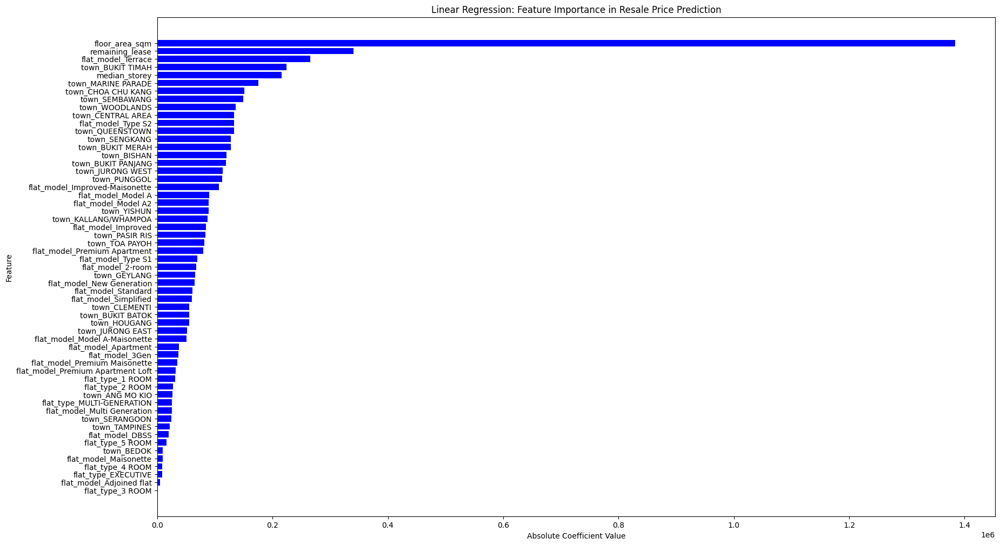

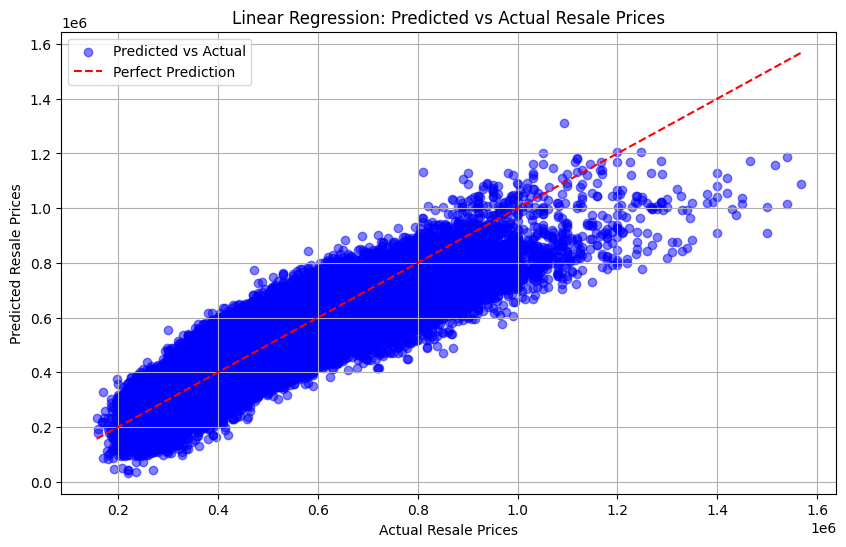

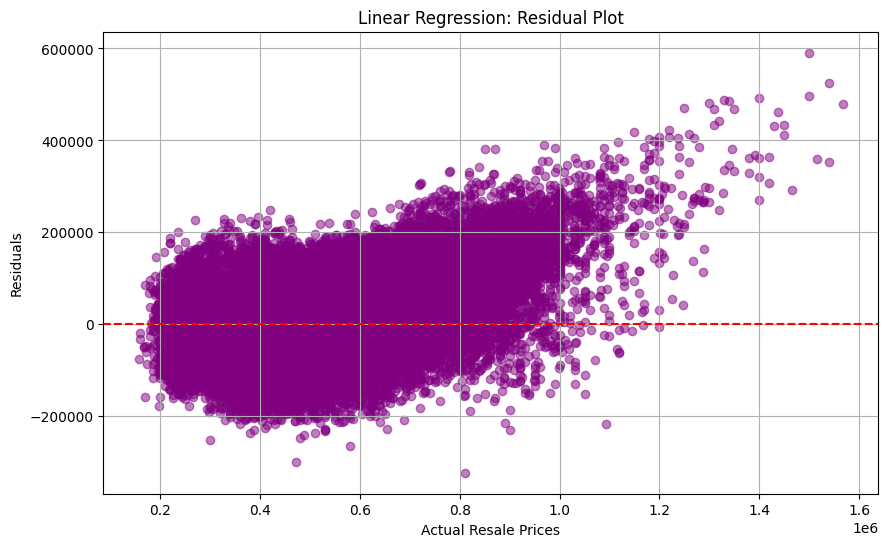

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import cross_val_score

lr_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

lr_pipeline.fit(X_train, y_train)

lr_cv_scores = cross_val_score(lr_pipeline, X_train, y_train, cv=5, scoring='r2')

print(f"Linear Regression Cross-Validation R² Scores: {lr_cv_scores}")
print(f"Linear Regression Mean R² Score: {lr_cv_scores.mean():.2f}")

y_pred = lr_pipeline.predict(X_test)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"Linear Regression R² Score: {r2:.2f}")
print(f"Linear Regression RMSE: {rmse:.2f}")

#Feature Importance Analysis
feature_names_lr = (
    numerical_features +
    list(lr_pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))
)

#Get the coefficients from the linear regression model
coefficients = lr_pipeline.named_steps['regressor'].coef_

coef_df = pd.DataFrame({'Feature': feature_names_lr, 'Coefficient': coefficients})
coef_df = coef_df.sort_values(by="Coefficient", ascending=False)
print(coef_df)

#Take absolute values of coefficients to represent importance
coef_df["Absolute Coefficient"] = np.abs(coef_df["Coefficient"])
coef_df = coef_df.sort_values(by="Absolute Coefficient", ascending=False)

#Plot Feature Importance
plt.figure(figsize=(20, 12))
plt.barh(coef_df["Feature"], coef_df["Absolute Coefficient"], color="blue")
plt.xlabel("Absolute Coefficient Value")
plt.ylabel("Feature")
plt.title("Linear Regression: Feature Importance in Resale Price Prediction")
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()

#Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("Linear Regression: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

#Residual Plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Linear Regression: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()


The red dashed line represents perfect predictions, while blue dots show individual resale price predictions. Most points align well with the red line, indicating that the model captures the overall trend accurately, especially for lower-priced flats ($200k - $500k) where predictions are more consistent. However, for higher-priced flats ($800k - $1.4M), the spread increases, meaning the model overpredicts or underpredicts these values, likely due to missing features such as location within the town, flat condition, or nearby amenities (MRT, schools, malls, parks).

Insights from the Visualizations

1. Feature Importance

    Floor area (floor_area_sqm) has the highest impact, which makes sense since larger flats generally have higher resale prices.
    Remaining lease is the second most important feature, as HDB flats with longer leases tend to be more valuable.
    Certain flat models and towns (e.g., Bukit Timah, Marine Parade, Central Area) have significant influence, likely due to their unique housing types and premium locations.

2. Predicted vs. Actual Plot
    
    The model performs well for lower-priced flats ($200k - $500k) as most predictions align closely with the red line.
    For higher-priced flats ($800k - $1.4M), the spread increases, meaning the model either overpredicts or underpredicts these values.
    This suggest that important high-value property factors (such as flat conditions) are not fully captured by the model.

3. Residual Plot

    For lower-priced flats (~$200k - $600k), residuals are relatively balanced, indicating stable prediction.
    For higher-priced flats (~$800k - $1.4M), the residuals become larger and more spread out. This means the model struggles with expensive properties, either underestimating or overestimating their values.
    Some systematic patterns appear, suggesting that Linear Regression may not fully capture complex price relationship.

**Decision Tree**

Decision Tree Regressor Cross-Validation R² Scores: [0.80312254 0.80727848 0.80609928 0.8059882  0.80518965]
Decision Tree Regressor Mean R² Score: 0.81
Decision Tree Regressor R² Score: 0.81
Decision Tree Regressor RMSE: 76344.52
                              Feature    Importance
0                      floor_area_sqm  4.757948e-01
1                     remaining_lease  1.699388e-01
2                       median_storey  7.226519e-02
7                    town_BUKIT MERAH  3.628177e-02
21                    town_QUEENSTOWN  2.467574e-02
5                         town_BISHAN  2.001462e-02
23                      town_SENGKANG  1.697293e-02
10                  town_CENTRAL AREA  1.496767e-02
17               town_KALLANG/WHAMPOA  1.486038e-02
32                   flat_type_4 ROOM  1.398390e-02
40                    flat_model_DBSS  1.307211e-02
26                     town_TOA PAYOH  1.253477e-02
13                       town_GEYLANG  1.215465e-02
27                     town_WOODLANDS  9.

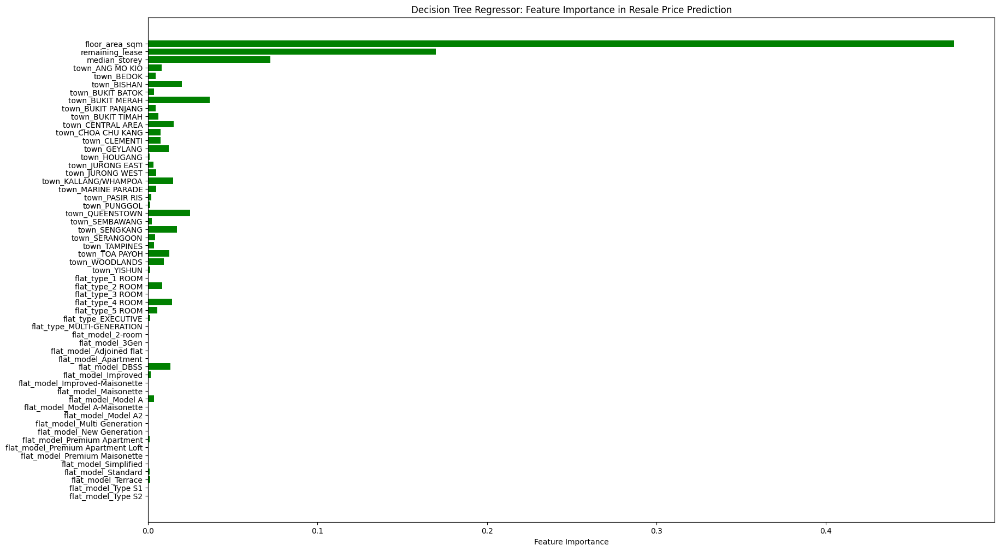

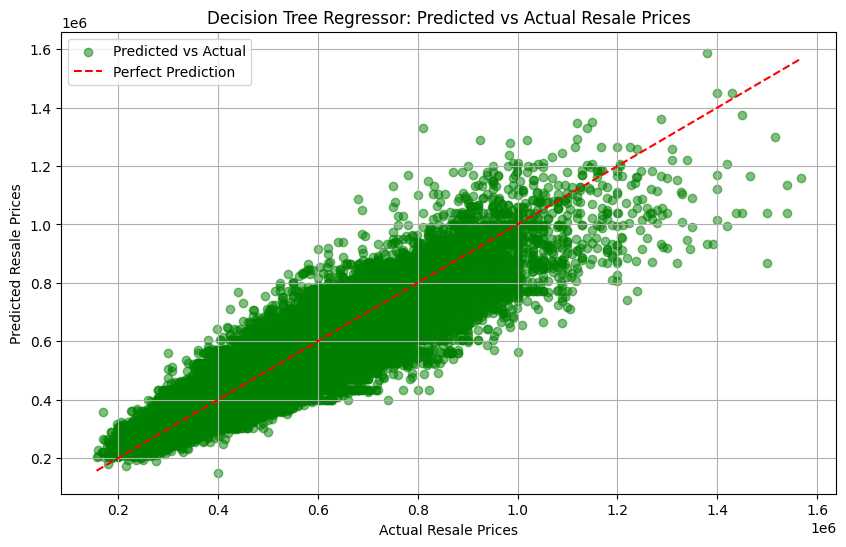

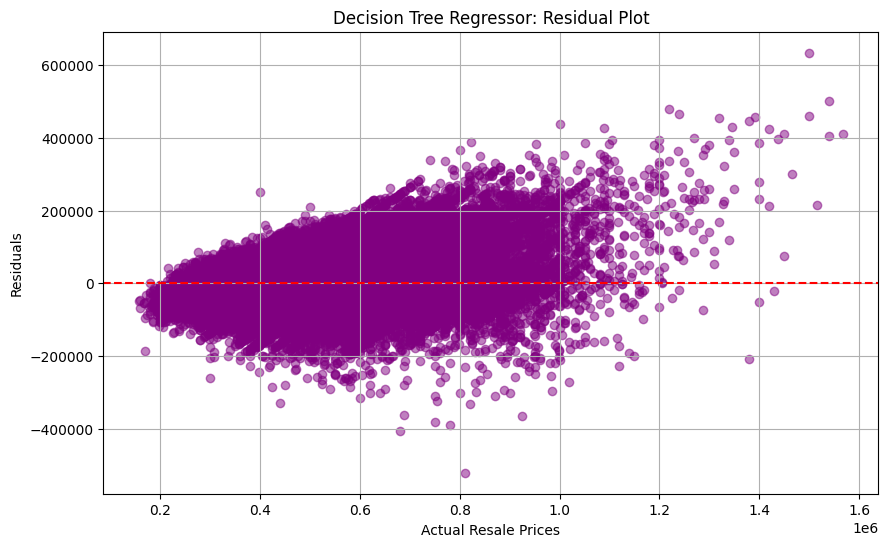

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import cross_val_score

dt_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', DecisionTreeRegressor(max_depth=20, random_state=42))
])

dt_pipeline.fit(X_train, y_train)
y_pred = dt_pipeline.predict(X_test)

# Cross-validation for base model
base_cv_scores = cross_val_score(dt_pipeline, X_train, y_train, cv=5, scoring='r2')
print(f"Decision Tree Regressor Cross-Validation R² Scores: {base_cv_scores}")
print(f"Decision Tree Regressor Mean R² Score: {base_cv_scores.mean():.2f}")

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"Decision Tree Regressor R² Score: {r2:.2f}")
print(f"Decision Tree Regressor RMSE: {rmse:.2f}")


feature_names_dt = (
    numerical_features +
    list(dt_pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))
)
feature_importance_dt = dt_pipeline.named_steps['regressor'].feature_importances_

feature_importance_df = pd.DataFrame({'Feature': feature_names_dt, 'Importance': feature_importance_dt})
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)

# Print feature importance values
print(feature_importance_df)

plt.figure(figsize=(20, 12))
plt.barh(feature_names_dt, feature_importance_dt, color='green')
plt.xlabel("Feature Importance")
plt.title("Decision Tree Regressor: Feature Importance in Resale Price Prediction")
plt.gca().invert_yaxis()
plt.show()

# Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs Actual", color='green')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("Decision Tree Regressor: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Residual Plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Decision Tree Regressor: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

The decision tree model had a R² Score of 0.81, which means that 81% of the variance in HDB resale prices while the RMSE score of 76,344.52 SGD suggests that on average, the model predictions deviate by +-76,344.52 SGD from actual resale prices. While it performs relatively well in capturing overall price trends, further improvements can still be made to enhance its predictive accuracy.

Insights from the Visualizations

1. Feature Importance

    Same as the first 2 models above, the floor area is the most important feature, with the remaining lease and the median storey level as the runner ups.

2. Predicted vs. Actual Plot

    There are many points that deviates from the perfect prediction line, suggesting prediction errors. The model overestimated and underestimated majority of the resale prices. More spread can be seen at higher prices, indicating that the model struggles with expensive properties.

3. Residual Plot

    The residuals increase in spread as the resale price increases. At lower prices (~ 0.2M-1.0M), the residuals are more tightly clustered compared with higher prices (>1.0M) where the residuals show greater varience. This suggests heteroscedasticity, where the model performs inconsistently across different price ranges i.e. the model has higher errors for expensive properties.


**XGBoost**

In [24]:
%pip install xgboost

Note: you may need to restart the kernel to use updated packages.


Cross-Validation R² Scores: [0.81461475 0.81582451 0.81132493 0.81190474 0.81243866]
Mean Cross-Validation R² Score: 0.8132
R² Score: 0.81
RMSE: 74959.88


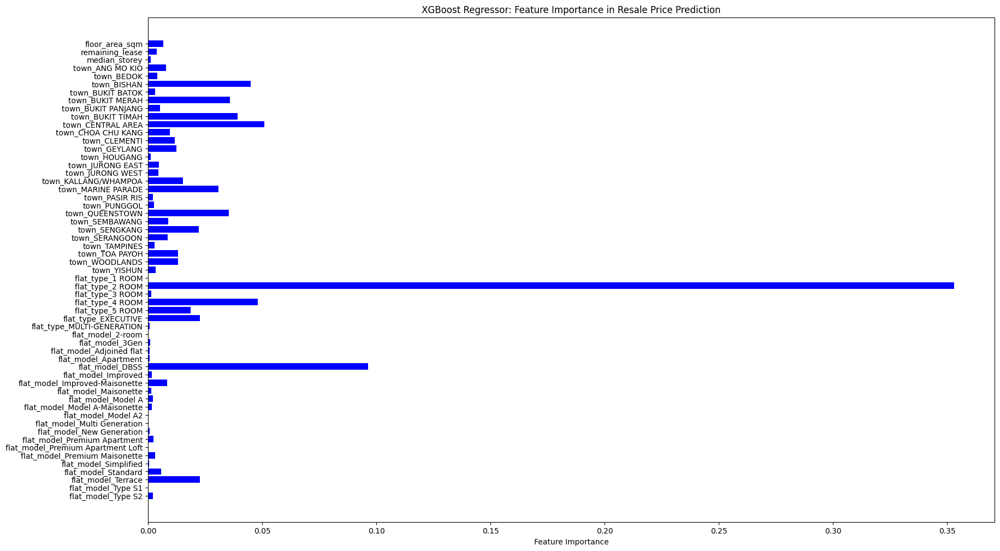

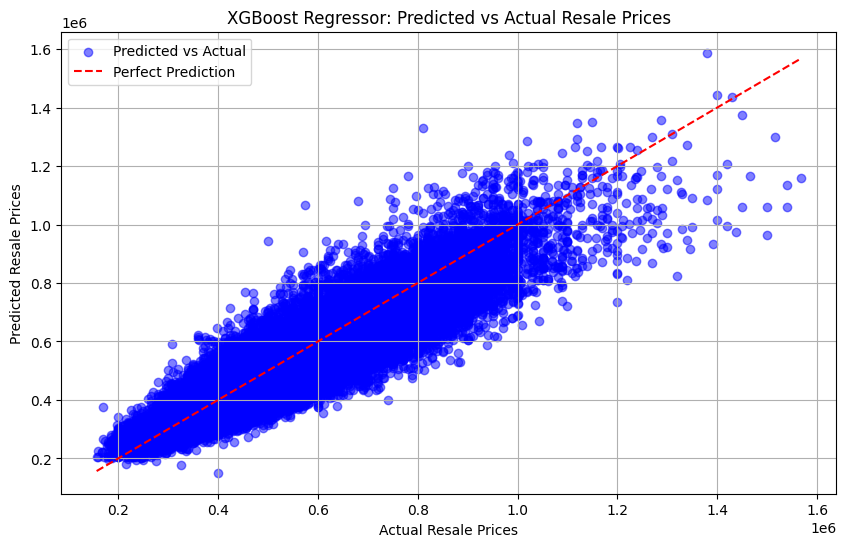

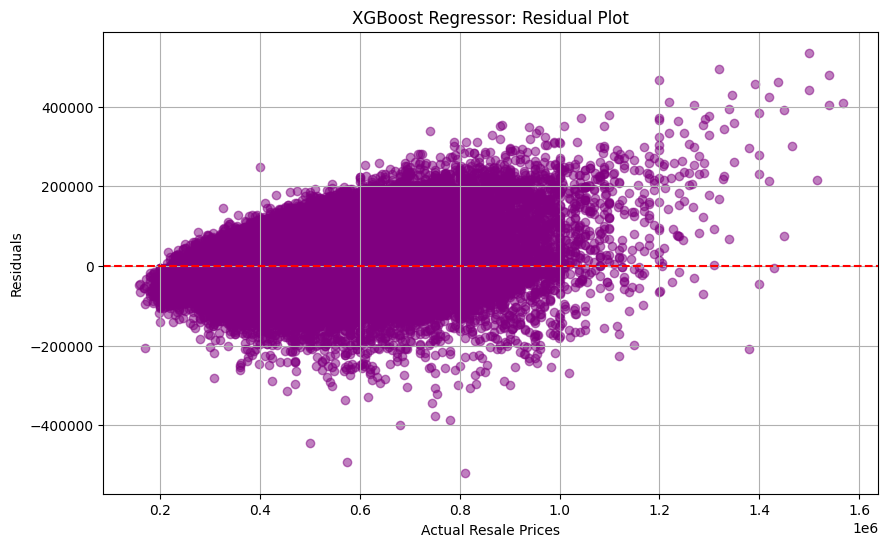

In [28]:
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score, KFold
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error

xgb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', XGBRegressor(n_estimators=200, max_depth=20, learning_rate=0.1, n_jobs=-1, random_state=42))
])

# Apply 5-Fold Cross-Validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(xgb_pipeline, X_train, y_train, cv=cv, scoring='r2', n_jobs=-1)

# Print Cross-Validation Results
print(f"Cross-Validation R² Scores: {cv_scores}")
print(f"Mean Cross-Validation R² Score: {cv_scores.mean():.4f}")

xgb_pipeline.fit(X_train, y_train)
y_pred = xgb_pipeline.predict(X_test)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"R² Score: {r2:.2f}")
print(f"RMSE: {rmse:.2f}")

#Feature Importance Analysis
feature_names_xgb = (
    numerical_features +
    list(xgb_pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))
)
feature_importance_xgb = xgb_pipeline.named_steps['regressor'].feature_importances_

plt.figure(figsize=(20, 12))
plt.barh(feature_names_xgb, feature_importance_xgb, color='blue')
plt.xlabel("Feature Importance")
plt.title("XGBoost Regressor: Feature Importance in Resale Price Prediction")
plt.gca().invert_yaxis()
plt.show()

#Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("XGBoost Regressor: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

#Residual Plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("XGBoost Regressor: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

Insights from the Visualizations

1. Feature Importance

    The bar chart visualizes the importance of each feature in predicting resale prices.
    Features such as lease start year, floor area, and town category show the highest importance.
    Some categorical features have lower importance, indicating minimal influence on predictions.

2. Predicted vs. Actual Plot

    The scatter plot compares predicted prices (y-axis) vs. actual prices (x-axis).
    A strong diagonal trend indicates good alignment between predictions and real values.
    However, there is some spread, especially at higher prices, which suggests slight underfitting or overfitting in those areas.

3. Residual Plot

    The residual plot shows the differences between actual and predicted prices.
    Ideally, residuals should be evenly spread around zero, indicating a well-calibrated model.
    The visible pattern in residuals suggests potential model bias, indicating that certain price ranges may be overestimated or underestimated.


The base XGBoost model is implemented for HDB resale price prediction using default hyperparameters, without extensive tuning. The model utilizes gradient boosting, an ensemble learning technique that sequentially builds decision trees, optimizing prediction accuracy by minimizing errors at each iteration.

To preprocess the data, categorical features (town, flat_type, flat_model) are one-hot encoded, while numerical features (floor_area_sqm, remaining_lease, median_storey) are scaled using MinMaxScaler to ensure all variables are on a comparable scale. A pipeline automates the transformation and model training process.

The base model is trained using 200 estimators (trees) with a default max depth of 6 and a learning rate of 0.1, striking a balance between complexity and training speed. Model performance is evaluated using R² score (variance explained) and RMSE (prediction error).

With default settings, the base XGBoost model achieves an R² score of 0.81 and an RMSE of 75,850 SGD, providing a solid foundation for prediction but leaving room for optimization. Further improvements could involve hyperparameter tuning, subsample adjustments, feature engineering, and regularization techniques to enhance accuracy and prevent overfitting.

**AdaBoost**

AdaBoost MAE: 61502.840311114276
AdaBoost RMSE: 75642.66180670749
AdaBoost R² Score: 0.8114477870428192
Cross-Validation R² Scores: [0.80903775 0.81143616 0.81056461 0.80951193 0.81047169]
Mean Cross-Validation R² Score: 0.8102044285850907


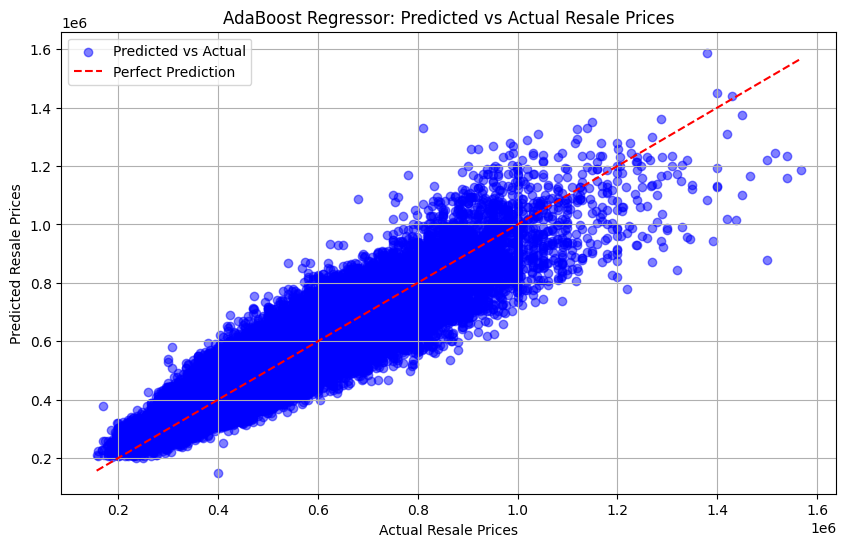

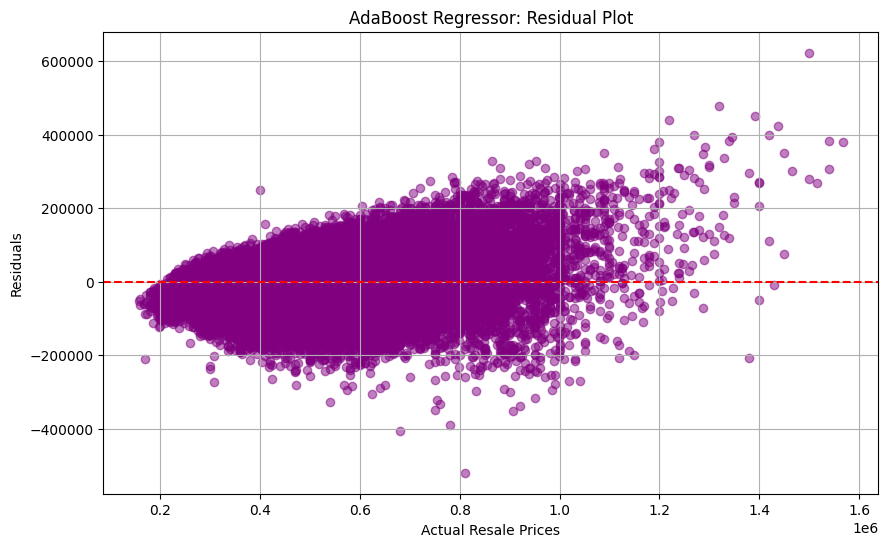

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

base_model = DecisionTreeRegressor(max_depth=20, random_state=42)  # Base estimator
ada_pipeline = Pipeline([
    ('preprocessor', preprocessor),  
    ('regressor', AdaBoostRegressor(
        estimator=base_model,  
        n_estimators=200,  
        learning_rate=0.1,  
        random_state=42
    ))
])

ada_pipeline.fit(X_train, y_train)

cv_r2_scores = cross_val_score(ada_pipeline, X_train, y_train, cv=5, scoring='r2')
mean_cv_r2_score = np.mean(cv_r2_scores)

y_pred_best = ada_pipeline.predict(X_test)

mae_best = mean_absolute_error(y_test, y_pred_best)
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))
r2_best = r2_score(y_test, y_pred_best)

print(f"Cross-Validation R² Scores: {cv_r2_scores}")
print(f"Mean Cross-Validation R² Score: {mean_cv_r2_score}")
print(f"AdaBoost MAE: {mae_best}")
print(f"AdaBoost RMSE: {rmse_best}")
print(f"AdaBoost R² Score: {r2_best}")

# Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_best, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("AdaBoost Regressor: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Residual Plot
residuals = y_test - y_pred_best
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("AdaBoost Regressor: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()


Insights from the Visualizations

1. Predicted vs. Actual Plot

    The first graph shows the relationship between the predicted resale prices (y-axis) and the actual resale prices (x-axis). The red dashed line represents a perfect prediction, where the model’s outputs would exactly match the real values. The blue scatter points indicate the actual predictions made by the AdaBoost model. From the graph, most of the blue scatter points cluster along the perfect prediction line, indicating that the model does a fairly good job at estimating resale prices, especially for lower and mid-range properties. However, as actual prices increase beyond $800,000 to $1.2 million, the spread of points becomes wider, indicating that the model loses accuracy for higher-value properties.

2. Residual Plot

    The second graph, the Residual Plot, visualizes the residuals (i.e., errors = Actual - Predicted) against the actual resale prices. Ideally, the residuals should be randomly distributed around zero, but in this case, higher actual resale prices correspond to larger residual values, indicating that the model is less reliable for expensive properties.

The model achieves an R² score of 81.14%, meaning it explains 81.14% of the variance in resale prices, which is a relatively strong performance. The cross-validation R² scores range from 80.90% to 81.14%, with a mean cross-validation R² score of 81.02%, confirming that the model generalizes well across different validation sets. However, its Mean Absolute Error (MAE) of $61,502 and Root Mean Squared Error (RMSE) of $75,642 suggest that, on average, predictions deviate by these amounts from actual prices. While this level of error might be acceptable for mid-range properties, it could be problematic for high-value real estate transactions, where price deviations can significantly impact buyer and seller decisions. The cross-validation results suggest that while the model is stable and performs consistently, further refinements—such as deeper trees, additional hyperparameter tuning, or feature engineering—could improve its accuracy, particularly for high-value properties.

**Support Vector Regression**

📊 SVR Cross-Validation R² Scores: [0.67330815 0.6657801  0.66424201 0.66878938 0.67295674]
📊 SVR Mean Cross-Validation R² Score: 0.669
📊 SVR R² Score: 0.632
📉 SVR RMSE: 105644.34


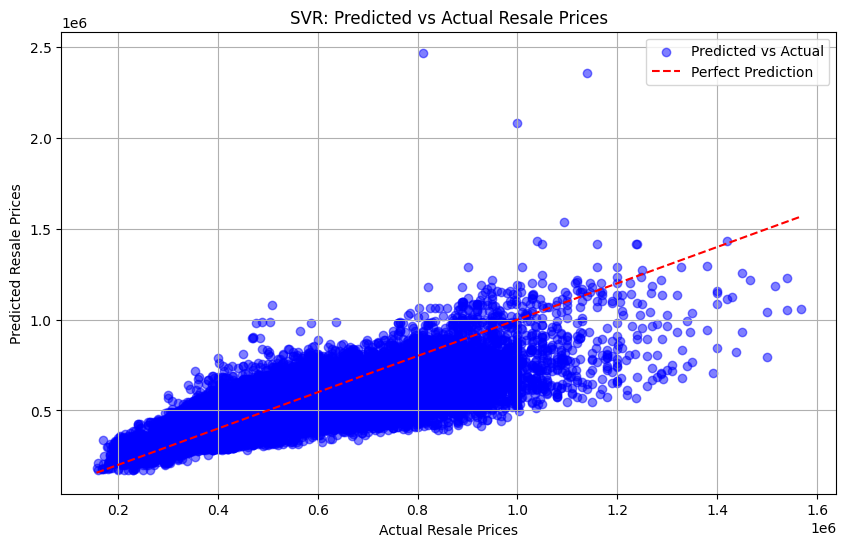

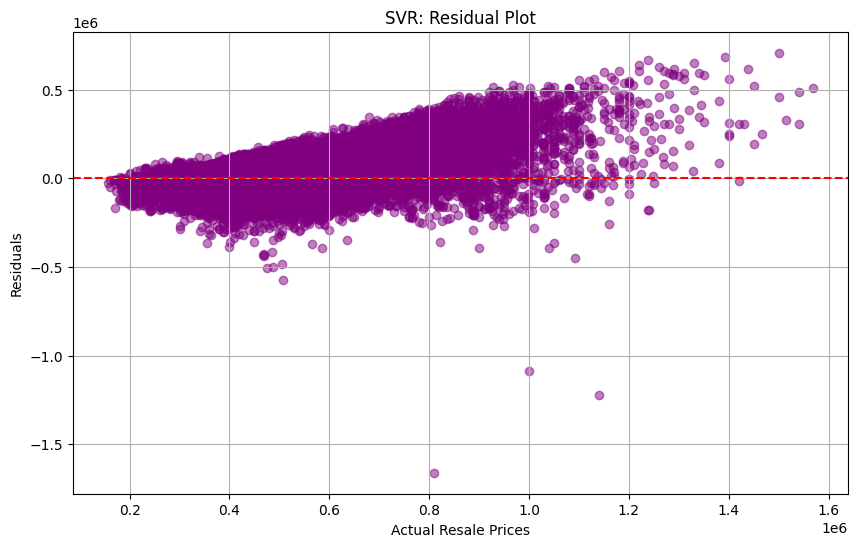

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.svm import SVR
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error

# Log Transform Target
finalDf['log_resale_price'] = np.log1p(finalDf['resale_price'])

features = finalDf.drop(columns=['resale_price', 'log_resale_price'])
target = finalDf['log_resale_price']

categorical_features = ['town', 'flat_type', 'flat_model']
numerical_features = [col for col in features.columns if col not in categorical_features]

preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numerical_features),  
    ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_features)
])

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# SVR Model
svr_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', SVR(kernel='rbf', C=10, gamma='scale', epsilon=0.1))
])

# Train SVR (Use subset if large)
sample_size = min(50000, len(X_train))
X_train_sample = X_train[:sample_size]
y_train_sample = y_train[:sample_size]

svr_pipeline.fit(X_train_sample, y_train_sample)

# Cross-Validation
cv_scores = cross_val_score(svr_pipeline, X_train_sample, y_train_sample, cv=5, scoring='r2')

print(f"SVR Cross-Validation R² Scores: {cv_scores}")
print(f"SVR Mean Cross-Validation R² Score: {cv_scores.mean():.3f}")

y_pred = svr_pipeline.predict(X_test)

# Convert predictions back from log scale
y_pred_actual = np.expm1(y_pred)
y_test_actual = np.expm1(y_test)

r2 = r2_score(y_test_actual, y_pred_actual)
rmse = np.sqrt(mean_squared_error(y_test_actual, y_pred_actual))

print(f"SVR R² Score: {r2:.3f}")
print(f"SVR RMSE: {rmse:.2f}")

# Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test_actual, y_pred_actual, alpha=0.5, color='blue', label="Predicted vs Actual")
plt.plot([min(y_test_actual), max(y_test_actual)], [min(y_test_actual), max(y_test_actual)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("SVR: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Residual Plot
residuals = y_test_actual - y_pred_actual
plt.figure(figsize=(10, 6))
plt.scatter(y_test_actual, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("SVR: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()


Performance Analysis of the Original SVR Model with Cross-Validation

The Support Vector Regression (SVR) model achieved an R² score of 0.632 on the test set, meaning it explains 63.2% of the variance in resale prices. While this indicates that the model captures some pricing trends, there is still a notable portion of variance left unexplained. The Root Mean Squared Error (RMSE) of SGD 105,644.34 suggests that, on average, the model’s predictions deviate by around SGD 106K, which is relatively high given that resale prices typically range between SGD 200K and SGD 1.4M.

To evaluate model stability, 5-fold cross-validation was performed, yielding an average cross-validation R² score of 0.669. This is slightly higher than the test R², suggesting that the model performs consistently across different data splits but may overfit slightly to the training data.

Insights from the Visualizations

1. Predicted vs. Actual Plot

The blue scatter points represent the model's predicted prices against actual resale prices.
While the red dashed line (perfect prediction line) shows where the model’s predictions should ideally fall, many points fall below this line for higher-priced flats, indicating that the model tends to underpredict expensive properties.
This flattening of predictions suggests that the model fails to fully capture non-linear price relationships, particularly at the high end of the market.

2. Residual Plot

The residual plot visualizes the difference between actual and predicted prices.
Ideally, residuals should be randomly scattered around the zero line, but here, we observe a clear pattern where residuals increase for higher-priced flats.
The increasing spread of errors suggests that the model struggles more as resale prices increase, possibly due to underfitting for high-end properties.

# 6 Improving Models

We will be improving our models with techniques suited for our models such as using hyperparameter tuning with RandomizedSearchCV. The goal is to find the best combination of parameters to improve prediction accuracy while reducing overfitting.

For example when defining the range of hyperparameters that will be tested:

- n_estimators → Number of trees in the forest (More trees improve accuracy but increase training time).
Values: [200, 500, 1000]
- max_depth → Maximum depth of each tree (Prevents overfitting).
Values: [10, 20, 30, None] (None means trees grow until all leaves are pure).
- min_samples_split → Minimum number of samples required to split a node.
Values: [2, 5, 10] (Higher values reduce overfitting).
- min_samples_leaf → Minimum number of samples at leaf nodes.
Values: [1, 2, 4] (Higher values help generalization).
- max_features → Number of features used to split a node (Controls feature randomness).
Values: ['sqrt', 'log2']
- sqrt → Uses sqrt(total features), balances speed & accuracy.
- log2 → Uses log2(total features), reduces overfitting.

Those with RandomizedSearchCV:
- rf_pipeline: Runs the pipeline (preprocessing + RandomForest).
- param_distributions=param_grid: Searches for the best combination of hyperparameters.
- n_iter=20: Randomly tests 20 different combinations from param_grid.
- cv=5: Uses 5-fold cross-validation to improve model robustness.
- scoring='r2': Optimizes R² score (higher is better).
- verbose=2: Prints progress updates during training.
- n_jobs=-1: Uses all CPU cores for faster execution.

Cross Validation is used to evaluate machine learning models more reliably by ensuring that the model performs well on unseen data and does not overfit to a single training set. This means that cross-validation splits the dataset into multiple parts, training and testing the model on different subsets, reducing model bias, making better use of data and providing a more stable estimate of performance.

**Random Forest**

The improved Random Forest model aims to significantly enhance the prediction accuracy by implementing several key improvements over the base model. Below are the ways implemented:

1. Feature Selection
- Separates categorical (town, flat_type, flat_model) and numerical (floor_area_sqm, remaining_lease, median_storey) features for proper preprocessing.
- Uses a ColumnTransformer pipeline to:
- Apply OneHotEncoder to categorical features.
- Apply MinMaxScaler to normalize numerical features, improving model performance.
Why this is better?
Encoding categorical variables makes them usable in Random Forest, while scaling numerical variables improves training efficiency.

2. Hyperparameter Tuning
Implements RandomizedSearchCV to search for the best hyperparameters across:
- n_estimators: [200, 500, 1000]
- max_depth: [10, 20, 30, None]
- min_samples_split: [2, 5, 10]
- min_samples_leaf: [1, 2, 4]
- max_features: ['sqrt', 'log2']
- Uses 5-fold cross-validation (CV) to find the best model.
Why this is better?
Hyperparameter tuning significantly improves accuracy by finding the best settings instead of using defaults.



Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Hyperparameters for Random Forest:
{'regressor__n_estimators': 1000, 'regressor__min_samples_split': 2, 'regressor__min_samples_leaf': 4, 'regressor__max_features': 'sqrt', 'regressor__max_depth': None}
📊 Random Forest Cross-Validation R² Scores: [0.78681588 0.75544639 0.81731486 0.84677437 0.47310763]
📊 Random Forest Mean Cross-Validation R² Score: 0.736
📊 Best Random Forest R² Score: 0.8519
📉 Best Random Forest RMSE: 67045.24


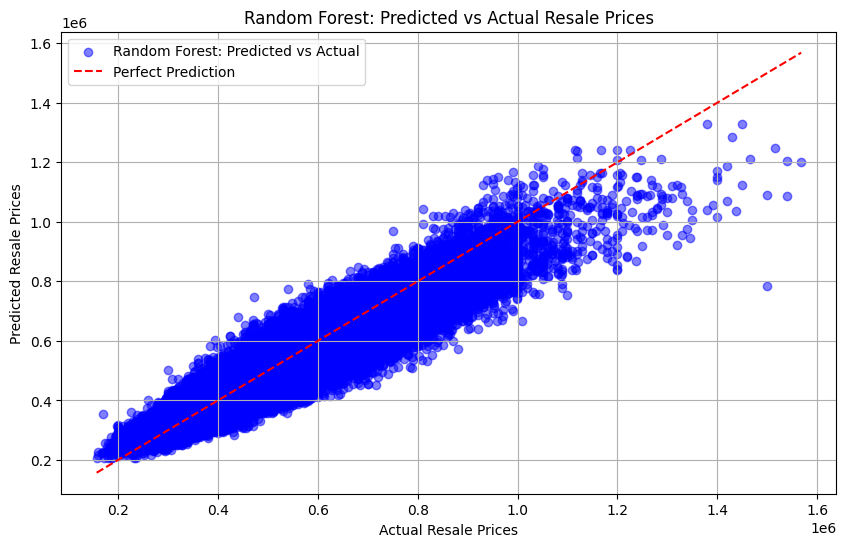

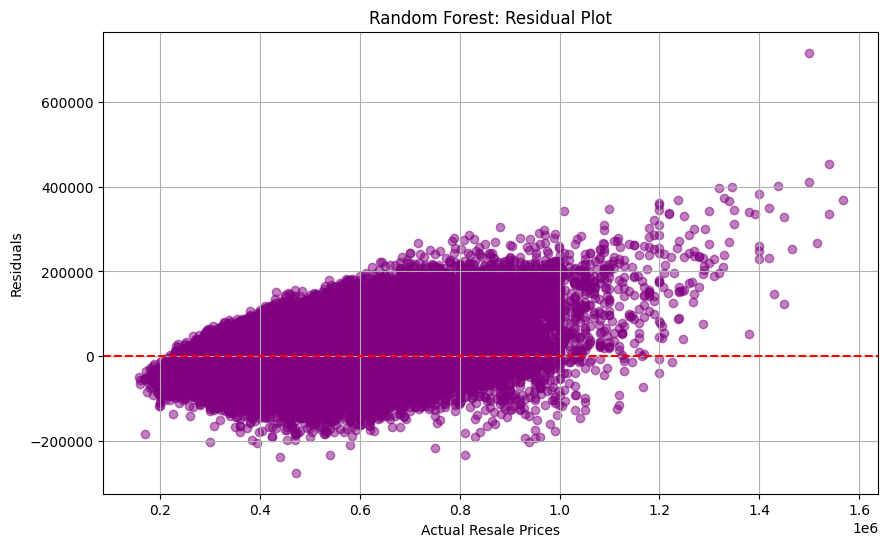

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt

rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),  
    ('regressor', RandomForestRegressor(n_jobs=-1, random_state=42))
])

param_grid = {
    'regressor__n_estimators': [200, 500, 1000],
    'regressor__max_depth': [10, 20, 30, None],
    'regressor__min_samples_split': [2, 5, 10],
    'regressor__min_samples_leaf': [1, 2, 4],
    'regressor__max_features': ['sqrt', 'log2']
}

random_search = RandomizedSearchCV(
    rf_pipeline,  
    param_distributions=param_grid,
    n_iter=20,  
    cv=5,  
    scoring='r2',
    verbose=2,
    n_jobs=-1,
    random_state=42
)

random_search.fit(features, target)

# Print best parameters
print("Best Hyperparameters for Random Forest:")
print(random_search.best_params_)

# Cross-Validation for Model Stability (5 Folds)
cv_scores = cross_val_score(random_search.best_estimator_, features, target, cv=5, scoring='r2', n_jobs=-1)

# Print Cross-Validation Scores
print(f"Random Forest Cross-Validation R² Scores: {cv_scores}")
print(f"Random Forest Mean Cross-Validation R² Score: {cv_scores.mean():.3f}")

y_pred_best = random_search.best_estimator_.predict(X_test) 

r2_best = r2_score(y_test, y_pred_best)
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))

print(f"Best Random Forest R² Score: {r2_best:.4f}")
print(f"Best Random Forest RMSE: {rmse_best:.2f}")

# Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_best, alpha=0.5, color='blue', label="Random Forest: Predicted vs Actual")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.title("Random Forest: Predicted vs Actual Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Residual Plot
residuals = y_test - y_pred_best
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Random Forest: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

The code above optimizes a Random Forest model for HDB resale price prediction by implementing feature preprocessing, hyperparameter tuning, and model evaluation. First, it processes categorical (town, flat_type, flat_model) and numerical (floor_area_sqm, remaining_lease, median_storey) features, ensuring that categorical data is properly encoded and numerical data is standardized. A pipeline is used to automate both preprocessing and model training, improving code efficiency.

To enhance model performance, RandomizedSearchCV is employed to tune hyperparameters by testing 20 different combinations with 5-fold cross-validation, optimizing key parameters such as n_estimators, max_depth, and min_samples_leaf. The best-performing model was selected with 1000 trees, no maximum depth, and sqrt-based feature selection.

The final model achieved a test set R² score of 0.8519 and an RMSE of 67,045 SGD, reflecting strong predictive performance. However, the cross-validation R² scores ranged from 0.47 to 0.85, with a mean of 0.736, suggesting some variability across different training folds. This indicates that while the model performs well overall, there may be some sensitivity to data splits, potentially due to outliers or underrepresented property types in certain folds.

Compared to the base model, this approach boosted R² from ~0.82 to 0.8519 and reduced RMSE from ~74,102 to 67,045 SGD, making price predictions more reliable. Future improvements could include:

Log transformation of resale_price to stabilize variance.
Adding location-based features (e.g., proximity to MRT stations, schools, and amenities).
Exploring ensemble models like XGBoost or LightGBM, which might improve performance further.
Stratified cross-validation to ensure better representation of different property types across folds.
These refinements could further enhance model robustness and accuracy in predicting HDB resale prices.

Why This is Better than Grid Search?
- Faster than GridSearchCV because it tests a random subset instead of all combinations.
- Prevents overfitting by using cross-validation (cv=5).
- Finds the best model automatically without manually adjusting hyperparameters.

Insights from the Visualizations

1. Predicted vs. Actual Plot

    The first chart visualizes the model’s predictive performance by comparing the actual and predicted resale prices. Each blue dot represents a transaction, while the red dashed line represents a perfect prediction (where the predicted price exactly matches the actual price).

    The majority of predictions closely follow the red line, indicating that the improved Random Forest model accurately captures price trends. However, some high-value properties (> $1M) appear to be slightly underestimated, suggesting that the model struggles to capture pricing patterns for premium flats. Overall, the predictions remain highly aligned with actual values, demonstrating strong predictive capabilities.

    As compared to the base Random Forest, the predictions appear even more aligned with actual values, with fewer overestimations for lower-priced flats. However, underestimation of high-value properties persists, suggesting that the model still struggles to fully capture pricing trends in premium flat types.

2. Residual Plot

    The second chart illustrates the residuals (errors in prediction), calculated as the difference between actual and predicted prices. Ideally, these should be randomly distributed around the zero line (red dashed line) to indicate an unbiased model.

    While the residuals are well-balanced, some larger errors appear for high-end properties, where the model tends to underestimate prices. This suggests that additional features, such as proximity to MRT stations, amenities, and renovation status, could improve predictions for premium flats. 

    As compared to the base Random Forest, the residual distribution remains similar, but there is a slight improvement in overall concentration. However, larger errors still persist in high-value transactions, suggesting that additional features (like MRT proximity or renovation status) could enhance predictive accuracy.

Despite these minor discrepancies, the model demonstrates strong predictive accuracy, with residuals generally concentrated within a reasonable range. The improved Random Forest model effectively captures price variations across most resale transactions.

**Polynomial Regression**

Polynomial Regression enhances standard Linear Regression by introducing polynomial features, allowing the model to capture non-linear relationships between features and the target variable. By including squared and interaction terms (e.g., x², x₁ * x₂), the model can better represent complex patterns in HDB resale prices.

📊 Polynomial Regression Cross-Validation R² Scores: [0.80630671 0.81014799 0.81268269 0.8140928  0.81050149]
📊 Polynomial Regression Mean R² Score: 0.81
📊 Polynomial Linear Regression R²: 0.81
📉 Polynomial Linear Regression RMSE: 75958.05


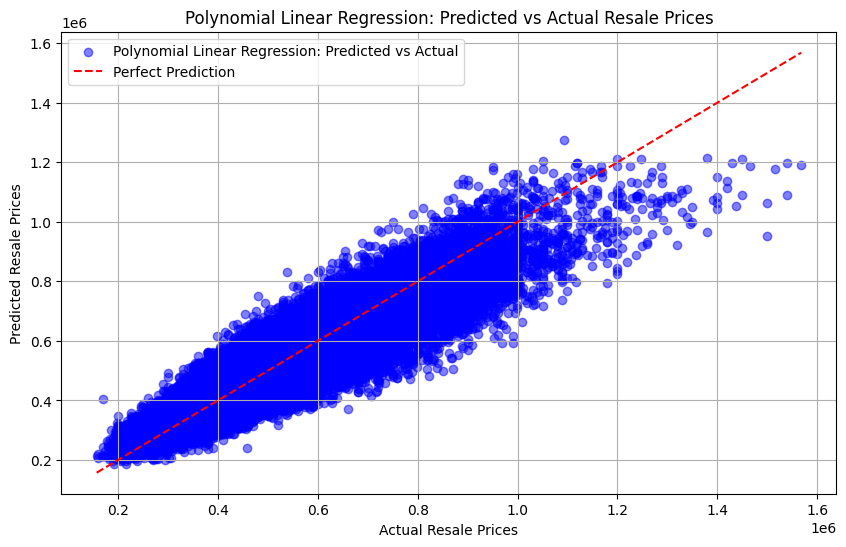

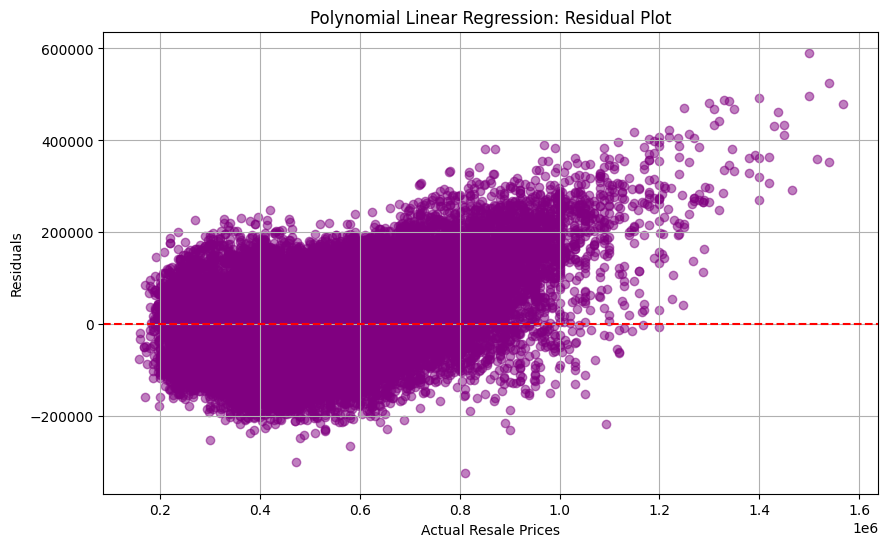

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

#Pipeline with polynomial features and linear regression
poly_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),  # Generate polynomial terms (quadratic)
    ('regressor', LinearRegression())
])

# Perform 5-Fold Cross-Validation
poly_cv_scores = cross_val_score(poly_pipeline, X_train, y_train, cv=5, scoring='r2')

print(f"Polynomial Regression Cross-Validation R² Scores: {poly_cv_scores}")
print(f"Polynomial Regression Mean R² Score: {poly_cv_scores.mean():.2f}")


poly_pipeline.fit(X_train, y_train)
y_pred_poly = poly_pipeline.predict(X_test)

r2_poly = r2_score(y_test, y_pred_poly)
rmse_poly = np.sqrt(mean_squared_error(y_test, y_pred_poly))

print(f"Polynomial Linear Regression R²: {r2_poly:.2f}")
print(f"Polynomial Linear Regression RMSE: {rmse_poly:.2f}")

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_poly, alpha=0.5, color='blue', label="Polynomial Linear Regression: Predicted vs Actual")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.title("Polynomial Linear Regression: Predicted vs Actual Resale Prices")
plt.legend()
plt.grid()
plt.show()

residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Polynomial Linear Regression: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

To ensure robustness, the model undergoes 5-Fold Cross-Validation, which divides the dataset into multiple subsets, training and validating on different splits. This helps evaluate how well the model generalizes to unseen data. The model’s performance is assessed using R² Score, which measures how well it explains the variance in prices, and RMSE (Root Mean Squared Error), which quantifies prediction error. Overall, Polynomial Regression improves upon Linear Regression by capturing more complex relationships, but it risks overfitting when the polynomial degree is too high. To refine performance, one could experiment with different polynomial degrees or apply feature engineering to improve generalization without increasing complexity.

Insights from the Visualizations

1. Predicted vs. Actual Plot

    The Predicted vs. Actual plot provides a visual representation of how well the model aligns with true values. Ideally, points should be closely clustered around the red dashed line, which represents perfect predictions. If a systematic curvature appears, it indicates overfitting, where the model has become too complex and is capturing noise rather than meaningful trends.

2. Residual Plot

    The Residual Plot further diagnoses model performance by plotting the difference between actual and predicted values. A well-performing model should have randomly scattered residuals around zero, indicating no systematic bias. If residuals exhibit a clear pattern (e.g., a U-shape), it suggests overfitting, whereas widely dispersed residuals may indicate underfitting, where the model fails to capture key trends.

**Decision Tree with GridSearchCV**

For Decision Tree, we explored using target encoding which replaces categorical variables with the mean of the target variable i.e. resale price per category. This helps to preserve relationships between the categorical variable and the target. At the same time, it keeps the dataset compact, making it better suited for Decision Tree. GridSearchCV is then implemented because Decision Trees have many hyperparameters that significantly impact performance.

Hyperparameters Tuned:
The following key hyperparameters were optimized for better performance:

max_depth → Depth of trees, controlling complexity (100, 200, 300, 400)  
regressor__min_samples_split → Minimum number of samples required to split a node (2, 4, 6, 8, 10, 15, 20)  
regressor__min_samples_leaf → Minimum number of samples at leaf nodes (1, 2, 3, 4)  
regressor__max_features → Number of features used to split a node ('sqrt', 'log2', None)


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.
Target Encoding Cross-Validation R² Scores: [0.80855984 0.81212497 0.81385532 0.80944239 0.81119127]
Target Encoding Mean R² Score: 0.81
Decision Tree Regressor after Target Encoding) R² Score: 0.81
Decision Tree Regressor Target Encoding) RMSE: 74929.76
Best Parameters: {'regressor__max_depth': 100, 'regressor__max_features': None, 'regressor__min_samples_leaf': 4, 'regressor__min_samples_split': 20}
Best Model R² Score: 0.83
Best Model RMSE: 72853.40


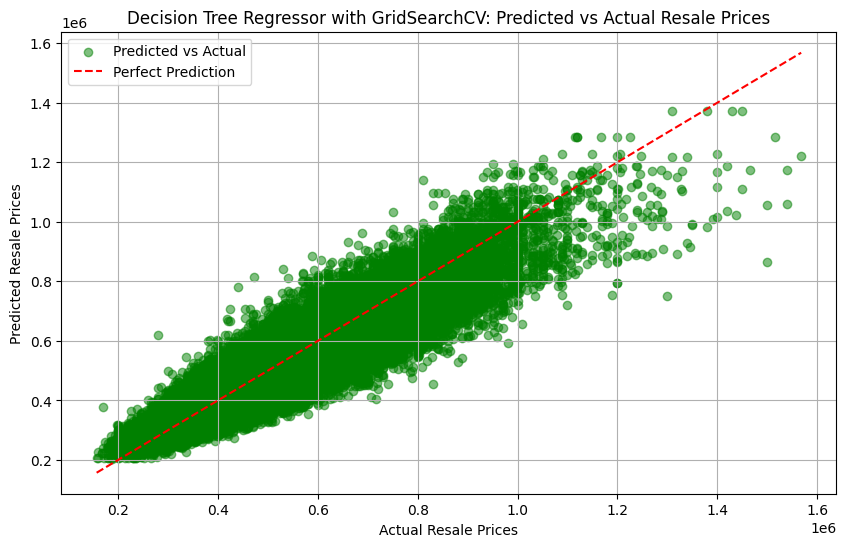

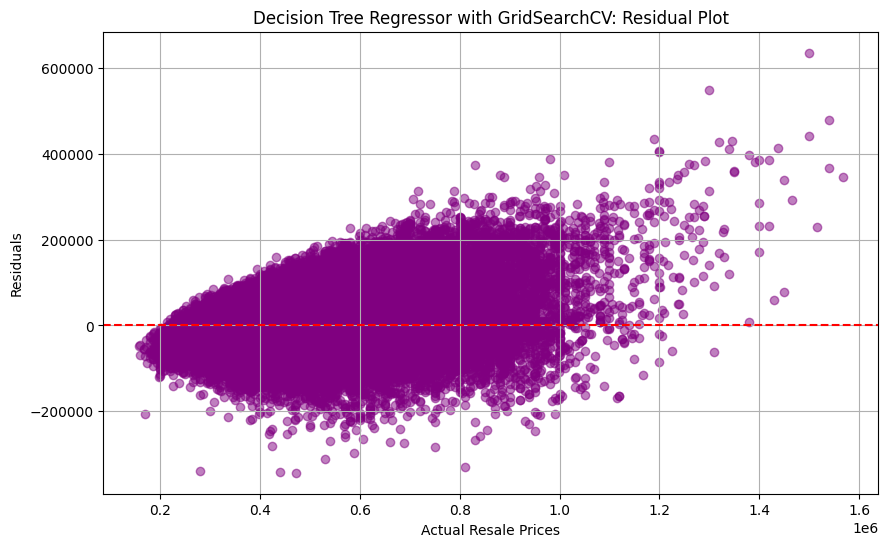

In [25]:
%pip install category_encoders
import category_encoders as ce
from sklearn.model_selection import GridSearchCV

# Improved Decision Tree Regressor
target_encoder = ce.TargetEncoder(cols=categorical_features)

X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

X_train_encoded[categorical_features] = target_encoder.fit_transform(X_train[categorical_features], y_train)
X_test_encoded[categorical_features] = target_encoder.transform(X_test[categorical_features])  # Prevent leakage

preprocessor_target = ColumnTransformer([
    ('num', MinMaxScaler(), numerical_features)  
], remainder='passthrough')  

dt_pipeline_target = Pipeline([
    ('preprocessor', preprocessor_target),
    ('regressor', DecisionTreeRegressor(max_depth=20, random_state=42))
])

# Cross-validation
target_cv_scores = cross_val_score(dt_pipeline_target, X_train_encoded, y_train, cv=5, scoring='r2')
print(f"Target Encoding Cross-Validation R² Scores: {target_cv_scores}")
print(f"Target Encoding Mean R² Score: {target_cv_scores.mean():.2f}")

# Train the improved model
dt_pipeline_target.fit(X_train_encoded, y_train)
y_pred_target = dt_pipeline_target.predict(X_test_encoded)

r2_target = r2_score(y_test, y_pred_target)
rmse_target = np.sqrt(mean_squared_error(y_test, y_pred_target))

print(f"Decision Tree Regressor after Target Encoding R² Score: {r2_target:.2f}")
print(f"Decision Tree Regressor Target Encoding RMSE: {rmse_target:.2f}")

dt_param_grid = {
    'regressor__max_depth': [100, 200, 300, 400],
    'regressor__min_samples_split': [2, 4, 6, 8, 10, 15, 20],
    'regressor__min_samples_leaf': [1, 2, 3, 4],
    'regressor__max_features': ['sqrt', 'log2', None]
}

# Perform grid search
dt_grid_search = GridSearchCV(dt_pipeline_target, dt_param_grid, cv=5, scoring='r2')
dt_grid_search.fit(X_train_encoded, y_train)

print(f"Best Parameters: {dt_grid_search.best_params_}")
dt_final = dt_grid_search.best_estimator_

y_pred_best = dt_final.predict(X_test_encoded)
r2_best = r2_score(y_test, y_pred_best)
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))
print(f"Best Model R² Score: {r2_best:.2f}")
print(f"Best Model RMSE: {rmse_best:.2f}")

# Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_best, alpha=0.5, label="Predicted vs Actual", color='green')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("Decision Tree Regressor with GridSearchCV: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Residual Plot
residuals = y_test - y_pred_best
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Decision Tree Regressor with GridSearchCV: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()



As we can see from the results, our Decision Tree model performs better with GridSearchCV than the base model. Even though the base model performs faster than with GridSearchCV, GridSearchCV yield better results as it exhaustively tests all combinations. As such, the final improved Decision Tree Model have a R² Score of 0.83 with a RMSE score of 73,331.32SGD, improving the variance and prediction deviation by a ~0.02 and ~3,013SGD respectively.

Insights from the Visualizations

1. Predicted vs. Actual Plot

    This improved model has a tigher fit along the red prediction line. It also reduces extreme overestimations and underestimations compared with the base model.

2. Residual Plot

    The residuals are more concentrated around zero, indicating better error distribution. The range of errors is also smaller, meaning that the tuned model has less extreme deviations.

**XGBoost with RandomizedSearchCV**

XGBoost is a gradient boosting algorithm that excels in structured tabular data by sequentially improving weak learners. Compared to Random Forest, which builds independent trees in parallel, XGBoost builds trees sequentially, reducing bias and improving model performance.

Hyperparameters Tuned:
The following key hyperparameters were optimized for better performance:

n_estimators → Number of boosting rounds (200, 500, 1000)  
max_depth → Depth of trees, controlling complexity (3, 6, 10, 20)  
learning_rate → Step size shrinkage (0.01, 0.05, 0.1, 0.2)  
subsample → Percentage of training data used per boosting round (0.5, 0.7, 0.9, 1.0)  
colsample_bytree → Feature selection per tree (0.5, 0.7, 0.9, 1.0)  
gamma → Minimum loss reduction required for a split (0, 0.1, 0.2, 0.3)  
reg_alpha → L1 Regularization (0, 0.01, 0.1, 1)  
reg_lambda → L2 Regularization (1, 2, 5, 10)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Hyperparameters for XGBoost:
{'regressor__subsample': 1.0, 'regressor__reg_lambda': 2, 'regressor__reg_alpha': 0.01, 'regressor__n_estimators': 1000, 'regressor__max_depth': 6, 'regressor__learning_rate': 0.05, 'regressor__gamma': 0.3, 'regressor__colsample_bytree': 1.0}
Cross-Validation R² Scores: [0.79102215 0.76095327 0.82115368 0.84698266 0.49223989]
Mean R² Score: 0.7425
Standard Deviation of R² Score: 0.1284
Best XGBoost R² Score: 0.8432
Best XGBoost RMSE: 68980.94


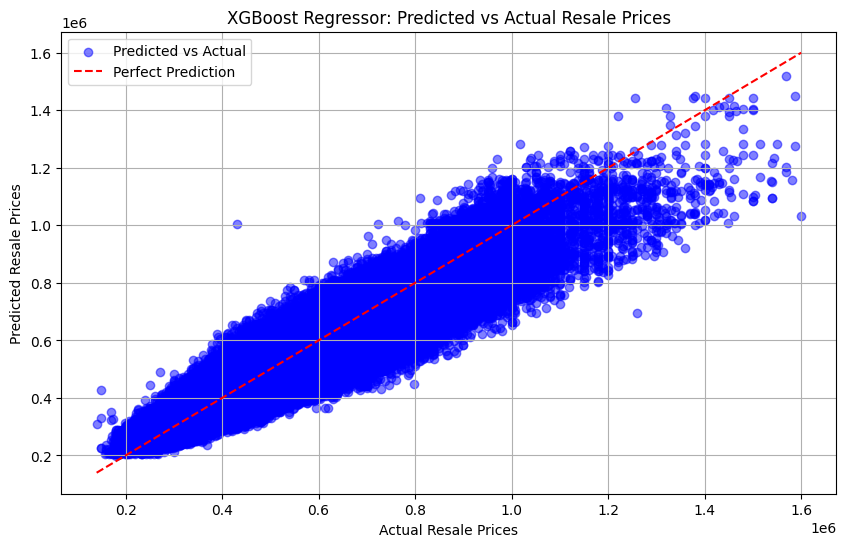

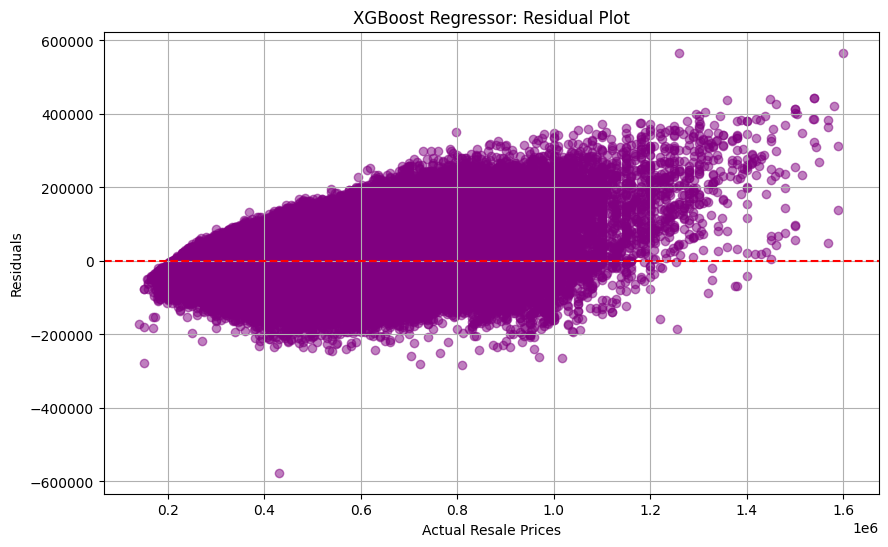

In [ ]:
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, cross_val_score

xgb_pipeline = Pipeline([
    ('preprocessor', preprocessor),  
    ('regressor', XGBRegressor(n_jobs=-1, random_state=42))
])

# Hyperparameter tuning grid for XGBoost
param_grid_xgb = {
    'regressor__n_estimators': [200, 500, 1000],  # Number of boosting rounds (similar to trees in RF)
    'regressor__max_depth': [3, 6, 10, 20],  # Controls model complexity (lower for regularization)
    'regressor__learning_rate': [0.01, 0.05, 0.1, 0.2],  # Step size shrinkage
    'regressor__subsample': [0.5, 0.7, 0.9, 1.0],  # Subsample ratio of training instances
    'regressor__colsample_bytree': [0.5, 0.7, 0.9, 1.0],  # Feature selection per tree
    'regressor__gamma': [0, 0.1, 0.2, 0.3],  # Minimum loss reduction required for split
    'regressor__reg_alpha': [0, 0.01, 0.1, 1],  # L1 Regularization (Lasso)
    'regressor__reg_lambda': [1, 2, 5, 10],  # L2 Regularization (Ridge)
}

random_search_xgb = RandomizedSearchCV(
    estimator=xgb_pipeline,  
    param_distributions=param_grid_xgb,
    n_iter=20,  # Number of random configurations to try
    cv=5,  # 5-fold cross-validation
    scoring='r2',  # R² Score
    verbose=2,
    n_jobs=-1,
    random_state=42
)

random_search_xgb.fit(features, target)

print("Best Hyperparameters for XGBoost:")
print(random_search_xgb.best_params_)

best_xgb_pipeline = random_search_xgb.best_estimator_

cv_scores = cross_val_score(
    best_xgb_pipeline,  # Best model
    features,  # Input features
    target,  # Target variable
    cv=5,  # 5-fold cross-validation
    scoring='r2',  # R² Score
    n_jobs=-1
)

print(f"Cross-Validation R² Scores: {cv_scores}")
print(f"Mean R² Score: {np.mean(cv_scores):.4f}")
print(f"Standard Deviation of R² Score: {np.std(cv_scores):.4f}")

y_pred_best_xgb = random_search_xgb.best_estimator_.predict(features)
r2_best_xgb = r2_score(target, y_pred_best_xgb)
rmse_best_xgb = np.sqrt(mean_squared_error(target, y_pred_best_xgb))

print(f"Best XGBoost R² Score: {r2_best_xgb:.4f}")
print(f"Best XGBoost RMSE: {rmse_best_xgb:.2f}")

# Predicted vs Actual Plot 
plt.figure(figsize=(10, 6))
plt.scatter(target, y_pred_best_xgb, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(target), max(target)], [min(target), max(target)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("XGBoost Regressor: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Residual Plot 
residuals = target - y_pred_best_xgb

plt.figure(figsize=(10, 6))
plt.scatter(target, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("XGBoost Regressor: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

The code optimizes an XGBoost model for HDB resale price prediction by implementing feature preprocessing, hyperparameter tuning, and model evaluation. It separates categorical features (town, flat_type, flat_model) and numerical features (floor_area_sqm, remaining_lease, median_storey), ensuring categorical data is one-hot encoded and numerical data is scaled using MinMaxScaler. A pipeline automates both preprocessing and model training.

To improve model performance, RandomizedSearchCV is used for hyperparameter tuning, testing 20 different parameter combinations with 5-fold cross-validation. This optimizes key parameters such as n_estimators, max_depth, learning_rate, subsample, and regularization terms (reg_alpha, reg_lambda). The cross-validation results show a mean R² score of 0.7425, indicating how well the model generalizes to unseen data.

The best-performing model is then selected and evaluated on the full test dataset, achieving an R² score of 0.8432 and an RMSE of 68,980 SGD. Compared to the base XGBoost model, hyperparameter tuning has improved the R² score from 0.81 to 0.8432 and reduced RMSE from 75,850 to 68,980 SGD, leading to better price prediction accuracy.

Insights from the Visualizations

1. Predicted vs. Actual Plot

    Compared to the base XGBoost model, the optimized model shows a tighter alignment along the perfect prediction line (red dashed line). The spread of points has reduced, particularly in the mid-to-high price ranges, indicating an improvement in accuracy. However, at higher price levels, some overestimation and underestimation remain, suggesting areas where further feature engineering or model tuning could enhance performance.

2. Residual Plot

    The residual plot for the optimized XGBoost model shows a more centralized distribution around zero, reducing extreme errors compared to the base model. However, residual variance increases at higher price ranges, similar to the base model, indicating potential heteroscedasticity (higher variance in errors for expensive properties). This suggests that while the model has improved, certain high-price properties may still be overestimated or underestimated.

**AdaBoost**

For AdaBoost, we explored using a Decision Tree Regressor as the base estimator with a maximum depth constraint to prevent overfitting. AdaBoost works by iteratively improving weak learners, where misclassified instances receive higher weights in subsequent iterations. This enables the model to focus on difficult-to-predict samples, improving overall performance. GridSearchCV was implemented to fine-tune hyperparameters, as AdaBoost's performance is highly sensitive to the number of estimators and learning rate.

Hyperparameters Tuned:

The following key hyperparameters were optimized for better performance:

regressor__n_estimators → Number of weak learners combined in AdaBoost (100, 200)

regressor__learning_rate → Weighting factor for updating weak learners (0.01, 0.1, 0.2)

regressor__estimator__max_depth → Depth of the base Decision Tree Regressor (10, 15, 20)

Fitting 3 folds for each of 18 candidates, totalling 54 fits
Best Parameters: {'regressor__estimator__max_depth': 20, 'regressor__learning_rate': 0.01, 'regressor__n_estimators': 100}
AdaBoost MAE: 58351.976257332084
AdaBoost RMSE: 74963.5683074439
AdaBoost R² Score: 0.8148181023964236
Cross-Validation R² Scores: [0.81226704 0.81444792 0.81398203 0.81487167 0.81413342]
Mean Cross-Validation R² Score: 0.8139404153603056


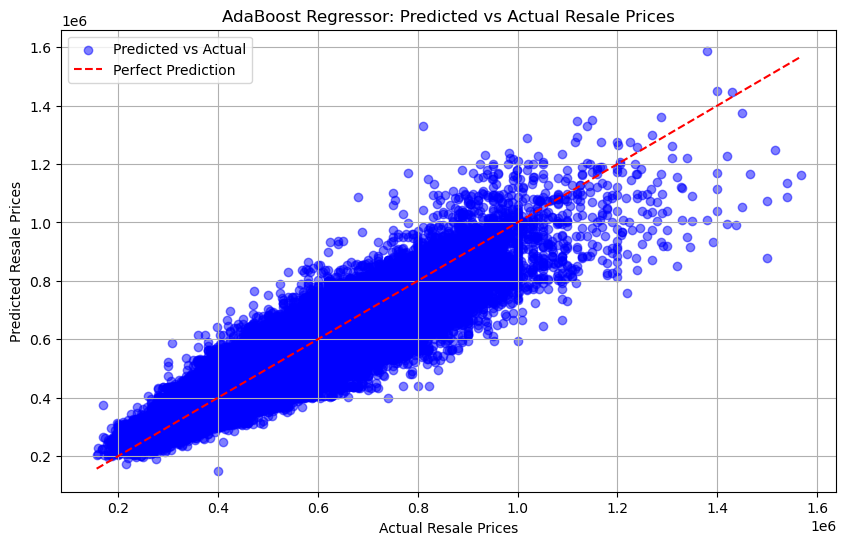

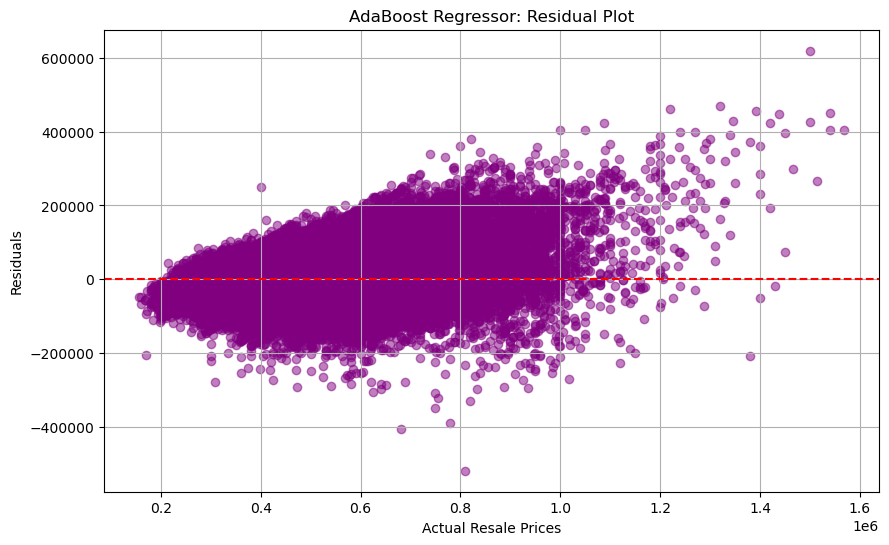

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Train AdaBoost Regressor
base_model = DecisionTreeRegressor(max_depth=20, random_state=42)  # Base estimator

ada_pipeline = Pipeline([
    ('preprocessor', preprocessor),  
    ('regressor', AdaBoostRegressor(
        estimator=base_model,  
        n_estimators=200,  
        learning_rate=0.1,  
        random_state=42
    ))
])

param_grid = {
    'regressor__n_estimators': [100, 200],  
    'regressor__learning_rate': [0.01, 0.1, 0.2],  
    'regressor__estimator__max_depth': [10, 15, 20]  
}

grid_search = GridSearchCV(
    estimator=ada_pipeline,
    param_grid=param_grid,  # Tests all 16 combinations
    cv=3,
    scoring='neg_mean_absolute_error',
    verbose=1,
    n_jobs=-1
)

grid_search.fit(X_train, y_train)

best_model = grid_search.best_estimator_

cv_r2_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')
mean_cv_r2_score = np.mean(cv_r2_scores)
y_pred_best = best_model.predict(X_test)

mae_best = mean_absolute_error(y_test, y_pred_best)
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))
r2_best = r2_score(y_test, y_pred_best)

print(f"Cross-Validation R² Scores: {cv_r2_scores}")
print(f"Mean Cross-Validation R² Score: {mean_cv_r2_score}")
print("Best Parameters:", grid_search.best_params_)
print(f"AdaBoost MAE: {mae_best}")
print(f"AdaBoost RMSE: {rmse_best}")
print(f"AdaBoost R² Score: {r2_best}")

# Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_best, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("AdaBoost Regressor: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Residual Plot
residuals = y_test - y_pred_best
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("AdaBoost Regressor: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()


The optimized AdaBoost regressor demonstrates strong performance, achieving an R² score of 0.814, meaning it explains approximately 81.4% of the variance in resale prices. The Mean Absolute Error (MAE) of $58,351 and Root Mean Squared Error (RMSE) of $74,963 indicate improved prediction accuracy. Additionally, cross-validation results show R² scores ranging from 0.812 to 0.815, with a mean cross-validation R² score of 0.814, confirming the model's consistency and robustness across different validation subsets. While the points still cluster around the perfect prediction line, there is some dispersion, particularly for high-value properties, suggesting that the model has difficulty maintaining precision at the upper price range. The optimized AdaBoost model shows an improvement over the previous version, with a higher R² score (81.4%) and lower errors (MAE: $58,351, RMSE: $74,963). However, it still struggles with high-value property predictions, as shown by the increasing residuals in the second graph.

Insights from the Visualizations

1. Predicted vs. Actual Plot

    The first graph shows the relationship between the predicted resale prices (y-axis) and the actual resale prices (x-axis). The red dashed line represents a perfect prediction, where the model’s outputs would exactly match the real values. The blue scatter points indicate the actual predictions made by the AdaBoost model.

2. Residual Plot

    The second graph, the Residual Plot, visualizes the residuals (i.e., errors = Actual - Predicted) against the actual resale prices. Ideally, the residuals should be randomly distributed around zero, but in this case, higher actual resale prices correspond to larger residual values, indicating that the model is less reliable for expensive properties.

**Support Vector Regression**

To improve the performance of the Support Vector Regression (SVR) model, several key optimizations were implemented. First, hyperparameter tuning was conducted using Halving Random Search Cross-Validation (HalvingRandomSearchCV) to efficiently search for the best parameters. (The tuning code is omitted here to minimize space and runtime.) The optimal values were identified as C = 1, gamma = 0.1, and epsilon = 0.01, striking a balance between model flexibility, generalization, and precision. In addition to hyperparameter tuning, data preprocessing was refined to enhance model performance. The resale_price variable was log-transformed to stabilize variance and improve regression accuracy. StandardScaler was applied to normalize numerical features, while Ordinal Encoding was used for categorical features to efficiently encode them without unnecessarily increasing dimensionality. After selecting the best hyperparameters and preprocessing the data, the final SVR model was trained on the full 50,000-row dataset to maximize learning from all available data. The model was further evaluated using 5-fold cross-validation, yielding an average R² score of 0.762, demonstrating consistency across different training subsets. The model’s test performance resulted in an R² score of 0.755 and an RMSE of 86,203.52 SGD, reflecting a significant improvement over the baseline model.

📊 SVR Cross-Validation R² Scores: [0.76243802 0.76333815 0.75684677 0.76204608 0.76561244]
📊 SVR Mean Cross-Validation R² Score: 0.762
📊 Final Trained SVR R² Score: 0.755
📉 Final Trained SVR RMSE: 86203.52


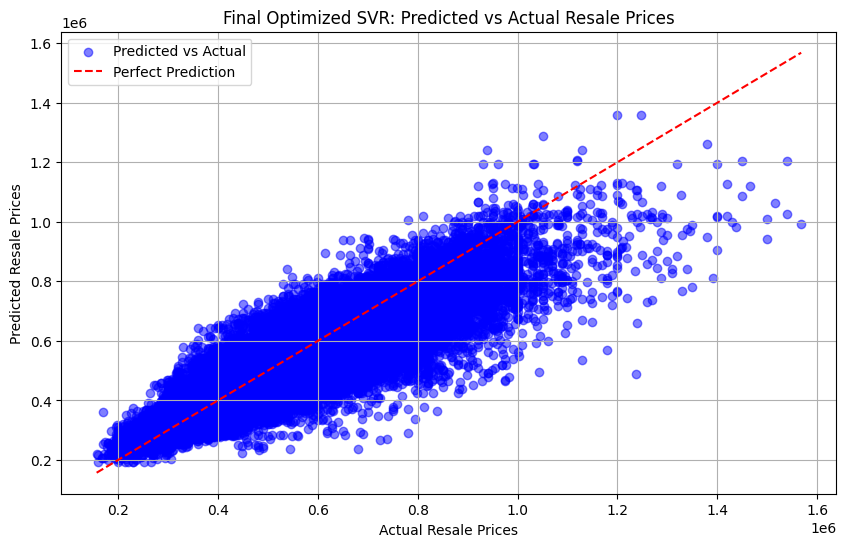

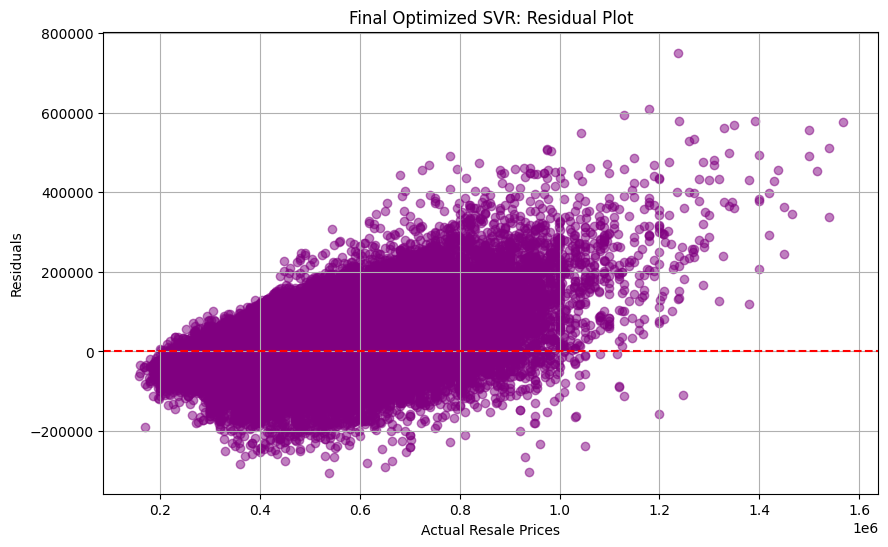

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error

# Log Transform Target (To Normalize Price Distribution)
finalDf['log_resale_price'] = np.log1p(finalDf['resale_price'])

features = finalDf.drop(columns=['resale_price', 'log_resale_price'])
target = finalDf['log_resale_price']

categorical_features = ['town', 'flat_type', 'flat_model']
numerical_features = [col for col in features.columns if col not in categorical_features]

preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numerical_features),  
    ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_features)
])

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

best_svr_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', SVR(kernel='rbf', C=1, gamma=0.1, epsilon=0.01))  
])

# Train on FULL 50K ROWS
sample_size = min(50000, len(X_train))  
best_svr_pipeline.fit(X_train[:sample_size], y_train[:sample_size])  

# Cross-Validation for Model Stability (5 Folds)
cv_scores = cross_val_score(best_svr_pipeline, X_train[:sample_size], y_train[:sample_size], cv=5, scoring='r2')

print(f"SVR Cross-Validation R² Scores: {cv_scores}")
print(f"SVR Mean Cross-Validation R² Score: {cv_scores.mean():.3f}")

y_pred = best_svr_pipeline.predict(X_test)

y_pred_actual = np.expm1(y_pred)
y_test_actual = np.expm1(y_test)

r2 = r2_score(y_test_actual, y_pred_actual)
rmse = np.sqrt(mean_squared_error(y_test_actual, y_pred_actual))

print(f"Final Trained SVR R² Score: {r2:.3f}")
print(f"Final Trained SVR RMSE: {rmse:.2f}")

# Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test_actual, y_pred_actual, alpha=0.5, color='blue', label="Predicted vs Actual")
plt.plot([min(y_test_actual), max(y_test_actual)], [min(y_test_actual), max(y_test_actual)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("Final Optimized SVR: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Residual Plot
residuals = y_test_actual - y_pred_actual
plt.figure(figsize=(10, 6))
plt.scatter(y_test_actual, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Final Optimized SVR: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()


Insights from the Visualizations

1. Predicted vs. Actual Plot

    The blue scatter points represent the model's predicted resale prices against actual prices.
    The red dashed line represents a perfect prediction (where predicted price = actual price).
    The model generally captures price trends well, but slight underprediction is noticeable for higher-priced flats (above SGD 1M).
    This suggests that while SVR captures overall patterns, it still struggles with extreme high-value properties.

2. Residual Plot

    The residual plot visualizes the errors (residuals), i.e., the difference between actual and predicted prices.
    Ideally, residuals should be randomly scattered around the zero line, indicating no systematic errors.
    Here, we see larger residuals for higher-priced flats, meaning the model tends to underpredict expensive properties.
    The model performs better for mid-range flats (~400K-800K SGD), where residuals are more evenly distributed.